In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
import sys
import math
import scipy as scipy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import hashlib
from IPython.display import display
from PIL import Image
from tqdm import tqdm
tqdm.pandas()

%matplotlib inline

In [8]:
EPOCHS = 20
SAMPLE_LEN = 100
Data_path="/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7"
IMAGE_PATH = "/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images"
TEST_PATH = "/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/test.csv"
TRAIN_PATH = "/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/train.csv"
SUB_PATH = "/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/sample_submission.csv"

sub = pd.read_csv(SUB_PATH)
test_data = pd.read_csv(TEST_PATH)
train_data = pd.read_csv(TRAIN_PATH)

In [9]:
train_data.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [10]:
test_data.head()

,image_id
0,Test_0
1,Test_1
2,Test_2
3,Test_3
4,Test_4


In [ ]:
!pip install matplotlib-venn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!apt-get -qq install -y libfluidsynth1

In [11]:
import plotly.express as px
import numpy as np

In [ ]:
def load_image(image_id):
    file_path = image_id + ".jpg"
    image = cv2.imread(IMAGE_PATH + file_path)
    #return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

train_images = train_data["image_id"][:SAMPLE_LEN].progress_apply(load_image)


100%|██████████| 100/100 [00:00<00:00, 2967.72it/s]


In [ ]:

# Initializing some plotting variables
pd.set_option('display.max_columns', 30)
label_font_dict = {'family':'sans-serif','size':13.5,'color':'brown','style':'italic'}
title_font_dict = {'family':'sans-serif','size':17.5,'color':'Blue','style':'italic'}

In [ ]:
# plant pathology 2020
pp_2020_train_csv_file = "train.csv"
pp_2020_test_csv_file = "test.csv"

## train images csv file name
train_images_info_csv = "/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/train.csv"
print("### Train images csv file is --> {} \n".format(train_images_info_csv))

## train images details
train_images_info_df = pd.read_csv(train_images_info_csv)
train_images_info_df

### Train images csv file is --> /content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/train.csv 



,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0
...,...,...,...,...,...
1816,Train_1816,0,0,0,1
1817,Train_1817,1,0,0,0
1818,Train_1818,1,0,0,0
1819,Train_1819,0,0,1,0


In [ ]:
# checking data types of the columns
train_images_info_df.dtypes


image_id             object
healthy               int64
multiple_diseases     int64
rust                  int64
scab                  int64
dtype: object

In [ ]:
def get_category_wise_counts(df, tgt_label_class, lbl_category):
    """
    Description : This function is created for generating the infected or non-infected statistics of every disease target label.
    
    Input parameters : It accepts the below 3 inputs:
        - df : `pandas dataframe`
            The dataframe that contains the details of captured samples.
        - tgt_label_class : `str`
            This represents the target class label.
        - lbl_category : `str`
            This represents the target label category that you want to written with the stats.
    
    Return : It returns the below object:
        - tgt_class_val_counts_df : `pandas dataframe`
            This contains the stats of each target class label.
    """
    tgt_class_val_counts_df = pd.DataFrame(df[[tgt_label_class]].value_counts())
    tgt_class_val_counts_df.reset_index(drop=False, inplace=True)
    tgt_class_val_counts_df['category'] = lbl_category
    tgt_class_val_counts_df.columns = ['infected','counts','category']
    if lbl_category != 'healthy':
        tgt_class_val_counts_df['infected'] = tgt_class_val_counts_df['infected'].apply(lambda val: 'No' if val == 0 else 'Yes')
    else:
        tgt_class_val_counts_df['infected'] = tgt_class_val_counts_df['infected'].apply(lambda val: 'Yes' if val == 0 else 'No')
    return tgt_class_val_counts_df

In [ ]:
healthy_stats = get_category_wise_counts(train_images_info_df, 'healthy', 'healthy')
healthy_stats

,infected,counts,category
0,Yes,1305,healthy
1,No,516,healthy


In [ ]:
multiple_diseases_stats = get_category_wise_counts(train_images_info_df, 'multiple_diseases', 'multiple_diseases')
multiple_diseases_stats

,infected,counts,category
0,No,1730,multiple_diseases
1,Yes,91,multiple_diseases


In [ ]:
rust_stats = get_category_wise_counts(train_images_info_df, 'rust', 'rust')
rust_stats

,infected,counts,category
0,No,1199,rust
1,Yes,622,rust


In [ ]:
scab_stats = get_category_wise_counts(train_images_info_df, 'scab', 'scab')
scab_stats

,infected,counts,category
0,No,1229,scab
1,Yes,592,scab


In [ ]:
tgt_diseases_dist = pd.concat([healthy_stats, multiple_diseases_stats, rust_stats, scab_stats], axis=0).reset_index(drop=True)
tgt_diseases_dist

,infected,counts,category
0,Yes,1305,healthy
1,No,516,healthy
2,No,1730,multiple_diseases
3,Yes,91,multiple_diseases
4,No,1199,rust
5,Yes,622,rust
6,No,1229,scab
7,Yes,592,scab


In [ ]:
tot_records = np.sum(tgt_diseases_dist[tgt_diseases_dist['category'] == 'healthy']['counts'].values)
tot_records

1821

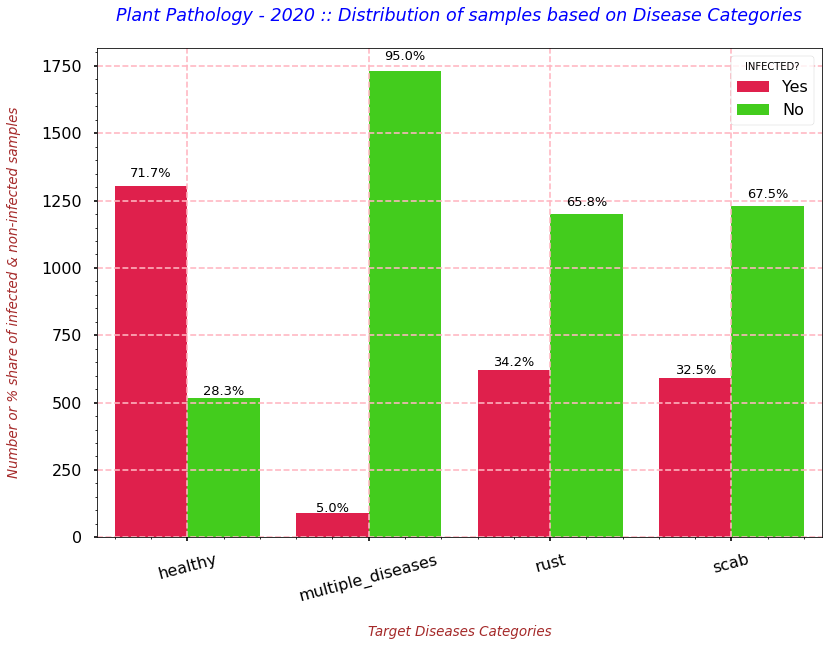

In [ ]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(13,9))
    fig = sns.barplot(data=tgt_diseases_dist, x='category', y='counts', hue='infected', palette='prism_r')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_records,1))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13, rotation=0)
    # Providing the labels and title to the graph
    plt.xlabel("\nTarget Diseases Categories", fontdict=label_font_dict)
    plt.xticks(rotation=15)
    plt.ylabel("Number or % share of infected & non-infected samples\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology - 2020 :: Distribution of samples based on Disease Categories\n", fontdict=title_font_dict)
    plt.legend(title='INFECTED?')

In [ ]:
"""""
From the above plot, we came to know that:

71.7% of TRAIN images are un-healthy. And, only 5% of TRAIN images have multiple diseases.
Only 28% of entire samples are non-infected or totally healthy.
And, in the dataset we have approximately same number of infected and non-infected samples for Rust and Scab.
"""""

'""\nFrom the above plot, we came to know that:\n\n71.7% of TRAIN images are un-healthy. And, only 5% of TRAIN images have multiple diseases.\nOnly 28% of entire samples are non-infected or totally healthy.\nAnd, in the dataset we have approximately same number of infected and non-infected samples for Rust and Scab.\n'

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
# Number and % of records that belongs to each target category
tgt_classes_share = go.Figure([go.Pie(labels=train_images_info_df.columns[1:], 
                                      values=train_images_info_df.iloc[:, 1:].sum().values)])

## Providing the figure labels properties
tgt_classes_share.update_layout(title_text="Number or % of records in each target category ", 
                                template="ggplot2", 
                                font={"color":"black", "family":"calibri", "size":15})

## Providing the figure properties
tgt_classes_share.data[0].marker.line.color = 'black'
tgt_classes_share.data[0].marker.line.width = 2.8
tgt_classes_share.show()

In [ ]:
train_image_only_mul_diseases_df = train_images_info_df[train_images_info_df['multiple_diseases'] == 1]
train_image_only_mul_diseases_df

,image_id,healthy,multiple_diseases,rust,scab
1,Train_1,0,1,0,0
6,Train_6,0,1,0,0
25,Train_25,0,1,0,0
36,Train_36,0,1,0,0
62,Train_62,0,1,0,0
...,...,...,...,...,...
1708,Train_1708,0,1,0,0
1779,Train_1779,0,1,0,0
1780,Train_1780,0,1,0,0
1784,Train_1784,0,1,0,0


In [ ]:
only_mul_dis_healthy_stats = get_category_wise_counts(train_image_only_mul_diseases_df, 'healthy', 'healthy')
only_mul_dis_healthy_stats

,infected,counts,category
0,Yes,91,healthy


In [ ]:
only_mul_dis_multiple_diseases_stats = get_category_wise_counts(train_image_only_mul_diseases_df, 'multiple_diseases', 'multiple_diseases')
only_mul_dis_multiple_diseases_stats

,infected,counts,category
0,Yes,91,multiple_diseases


In [ ]:
only_mul_dis_rust_stats = get_category_wise_counts(train_image_only_mul_diseases_df, 'rust', 'rust')
only_mul_dis_rust_stats

,infected,counts,category
0,No,91,rust


In [ ]:
only_mul_dis_scab_stats = get_category_wise_counts(train_image_only_mul_diseases_df, 'scab', 'scab')
only_mul_dis_scab_stats

,infected,counts,category
0,No,91,scab


In [ ]:
only_mul_dis_tgt_diseases_dist = pd.concat([only_mul_dis_healthy_stats, only_mul_dis_multiple_diseases_stats, 
                                            only_mul_dis_rust_stats, only_mul_dis_scab_stats], axis=0).reset_index(drop=True)
only_mul_dis_tgt_diseases_dist

,infected,counts,category
0,Yes,91,healthy
1,Yes,91,multiple_diseases
2,No,91,rust
3,No,91,scab


In [ ]:
tmp_df_healthy = {'infected': 'No', 'counts': 0, 'category': 'healthy'}
tmp_df_mul_dis = {'infected': 'No', 'counts': 0, 'category': 'multiple_diseases'}
tmp_df_rust = {'infected': 'Yes', 'counts': 0, 'category': 'rust'}
tmp_df_scab = {'infected': 'Yes', 'counts': 0, 'category': 'scab'}

only_mul_dis_tgt_diseases_dist = only_mul_dis_tgt_diseases_dist.append([tmp_df_healthy, tmp_df_mul_dis, tmp_df_rust, tmp_df_scab],
                                                                       ignore_index = True)


In [ ]:
only_mul_dis_tgt_diseases_dist

,infected,counts,category
0,Yes,91,healthy
1,Yes,91,multiple_diseases
2,No,91,rust
3,No,91,scab
4,No,0,healthy
5,No,0,multiple_diseases
6,Yes,0,rust
7,Yes,0,scab


In [ ]:
only_mul_dis_tot_records = np.sum(only_mul_dis_tgt_diseases_dist[only_mul_dis_tgt_diseases_dist['category'] == 'healthy']['counts'].values)
only_mul_dis_tot_records

91

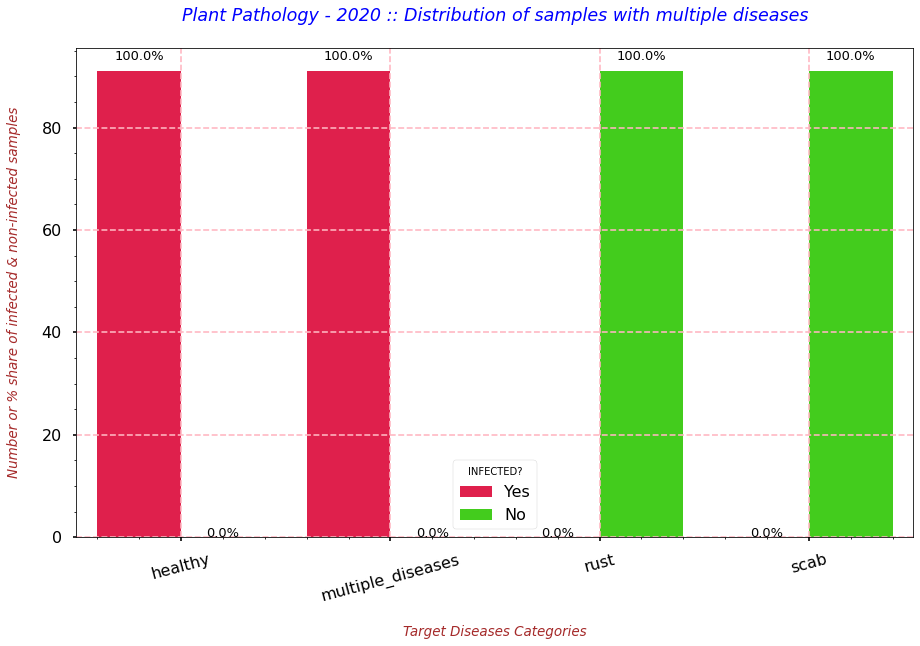

In [ ]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(15,9))
    fig = sns.barplot(data=only_mul_dis_tgt_diseases_dist, x='category', y='counts', hue='infected', palette='prism_r')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/only_mul_dis_tot_records,1))+"%"}', (x + width/2, y + height*1.025), ha='center', fontsize=13, rotation=0)
    # Providing the labels and title to the graph
    plt.xlabel("\nTarget Diseases Categories", fontdict=label_font_dict)
    plt.xticks(rotation=15)
    plt.ylabel("Number or % share of infected & non-infected samples\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology - 2020 :: Distribution of samples with multiple diseases\n", fontdict=title_font_dict)
    plt.legend(title='INFECTED?')

In [ ]:
train_image_only_unhealthy_df = train_images_info_df[train_images_info_df['healthy'] == 0]
train_image_only_unhealthy_df

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
3,Train_3,0,0,1,0
6,Train_6,0,1,0,0
7,Train_7,0,0,0,1
...,...,...,...,...,...
1813,Train_1813,0,0,1,0
1815,Train_1815,0,1,0,0
1816,Train_1816,0,0,0,1
1819,Train_1819,0,0,1,0


In [ ]:
only_unhealthy_stats = get_category_wise_counts(train_image_only_unhealthy_df, 'healthy', 'healthy')
only_unhealthy_stats

,infected,counts,category
0,Yes,1305,healthy


In [ ]:
only_unhealthy_multiple_diseases_stats = get_category_wise_counts(train_image_only_unhealthy_df, 'multiple_diseases', 'multiple_diseases')
only_unhealthy_multiple_diseases_stats

,infected,counts,category
0,No,1214,multiple_diseases
1,Yes,91,multiple_diseases


In [ ]:
only_unhealthy_rust_stats = get_category_wise_counts(train_image_only_unhealthy_df, 'rust', 'rust')
only_unhealthy_rust_stats

,infected,counts,category
0,No,683,rust
1,Yes,622,rust


In [ ]:
only_unhealthy_scab_stats = get_category_wise_counts(train_image_only_unhealthy_df, 'scab', 'scab')
only_unhealthy_scab_stats

,infected,counts,category
0,No,713,scab
1,Yes,592,scab


In [ ]:
only_unhealthy_tgt_diseases_dist = pd.concat([only_unhealthy_stats, only_unhealthy_multiple_diseases_stats, 
                                              only_unhealthy_rust_stats, only_unhealthy_scab_stats], axis=0).reset_index(drop=True)
only_unhealthy_tgt_diseases_dist

,infected,counts,category
0,Yes,1305,healthy
1,No,1214,multiple_diseases
2,Yes,91,multiple_diseases
3,No,683,rust
4,Yes,622,rust
5,No,713,scab
6,Yes,592,scab


In [ ]:
tmp_df_unhealthy = {'infected': 'No', 'counts': 0, 'category': 'healthy'}

only_unhealthy_tgt_diseases_dist = only_unhealthy_tgt_diseases_dist.append(tmp_df_unhealthy, ignore_index = True)
only_unhealthy_tgt_diseases_dist

,infected,counts,category
0,Yes,1305,healthy
1,No,1214,multiple_diseases
2,Yes,91,multiple_diseases
3,No,683,rust
4,Yes,622,rust
5,No,713,scab
6,Yes,592,scab
7,No,0,healthy


In [ ]:
only_unhealthy_tot_records = np.sum(only_unhealthy_tgt_diseases_dist[only_unhealthy_tgt_diseases_dist['category'] == 'healthy']['counts'].values)
only_unhealthy_tot_records


1305

,image_id,healthy,multiple_diseases,rust,scab



### Therefore, number of un-healthy samples are suffering from either one or both RUST & SCAB at the same time are --> 0 ### 




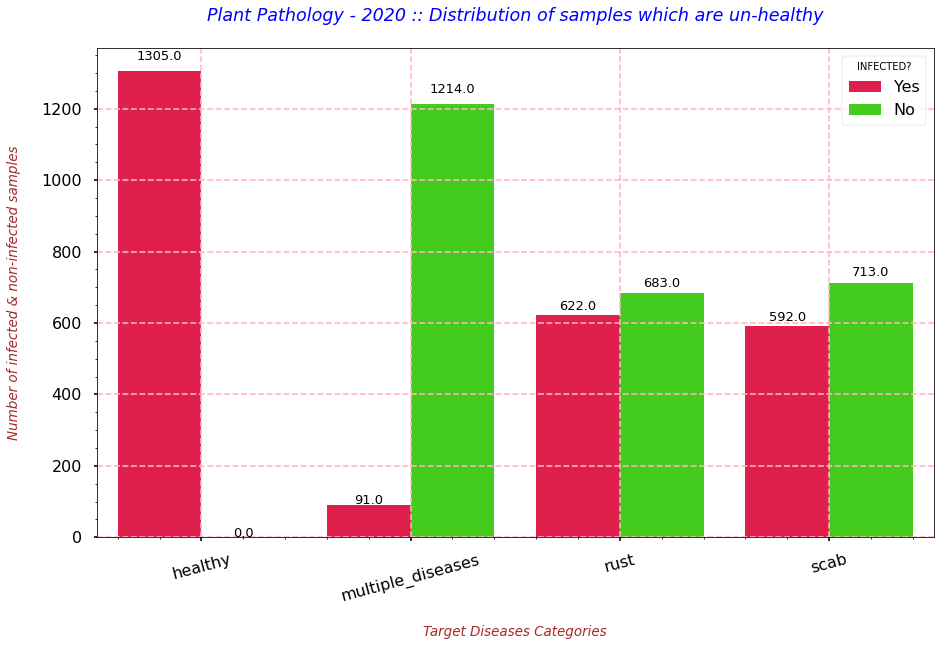

In [ ]:
# This will print the sample which are un-healthy and suffering from RUST and SCAB at the same time
display(train_image_only_unhealthy_df[(train_image_only_unhealthy_df['rust'] == 1) & (train_image_only_unhealthy_df['scab'] == 1)])

num_rec = train_image_only_unhealthy_df[(train_image_only_unhealthy_df['rust'] == 1) & (train_image_only_unhealthy_df['scab'] == 1)].shape[0]
print("\n### Therefore, number of un-healthy samples are suffering from either one or both RUST & SCAB at the same time are --> {} ### \n\n".format(num_rec))

# Displaying the same via graph
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(15,9))
    fig = sns.barplot(data=only_unhealthy_tgt_diseases_dist, x='category', y='counts', hue='infected', palette='prism_r')
    # Using the "patches" function we will get the location of the rectangle bars from the graph.
    ## Then by using those location(width & height) values we will add the annotations
    for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(height)}', (x + width/2, y + height*1.025), ha='center', fontsize=13, rotation=0)
    # Providing the labels and title to the graph
    plt.xlabel("\nTarget Diseases Categories", fontdict=label_font_dict)
    plt.xticks(rotation=15)
    plt.ylabel("Number of infected & non-infected samples\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology - 2020 :: Distribution of samples which are un-healthy\n", fontdict=title_font_dict)
    plt.legend(title='INFECTED?')

In [ ]:
# Displaying the relationship b/w the TARGET Categories
tgt_classes_relation = px.parallel_categories(train_images_info_df[["healthy", "multiple_diseases", "rust", "scab"]], 
                             color="healthy", 
                             color_continuous_scale="tropic",
                             title="Relationship b/w Target Categories")
tgt_classes_relation

In [ ]:
train_images_info_df

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0
...,...,...,...,...,...
1816,Train_1816,0,0,0,1
1817,Train_1817,1,0,0,0
1818,Train_1818,1,0,0,0
1819,Train_1819,0,0,1,0


In [ ]:
healthy_sampled_images = train_images_info_df[train_images_info_df['healthy'] == 1][['image_id']].sample(n=24, random_state=91, replace=False)
healthy_sampled_images['image_id'] = healthy_sampled_images['image_id'].apply(lambda img_name: img_name+'.jpg')
healthy_sampled_images = list(healthy_sampled_images['image_id'].values)

healthy_sampled_images_tbd = []
for img in healthy_sampled_images:
    healthy_sampled_images_tbd.append(os.path.join(os.path.join(os.path.join(os.path.join("/content/drive/MyDrive/Selected 1 pro/kaggle.json", "input"), "/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7"), "images"), img))

healthy_sampled_images_tbd[0:5]

['/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_1724.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_1381.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_478.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_1282.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_630.jpg']

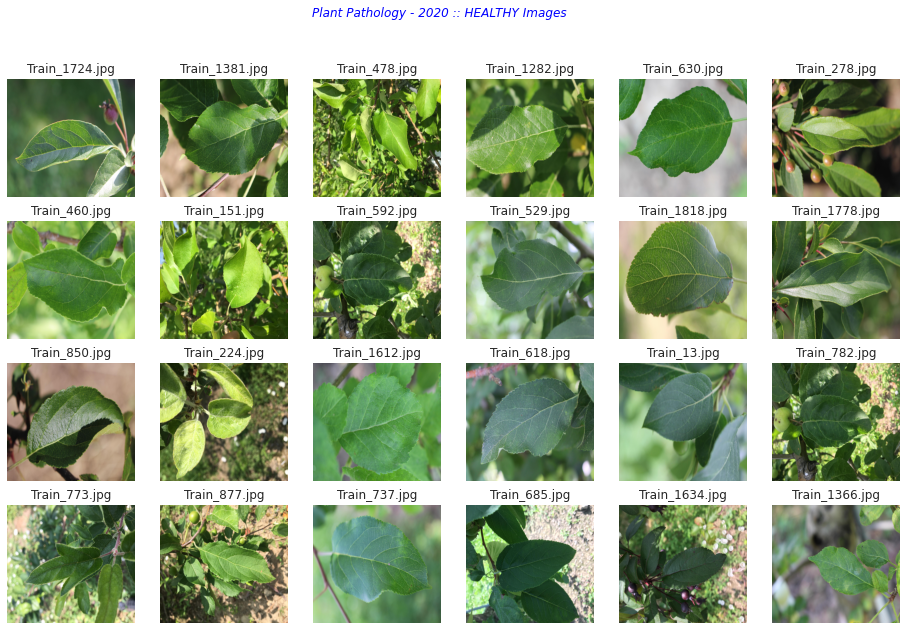

In [ ]:

def visualize_images(images_names_list, img_class, graph_rows=4, graph_cols=6):
    """
    Description : This function is created for visualizing some of the IMAGES of each TARGET Class Category.
    
    Input parameters : It accepts the below 4 inputs:
        - images_names_list : `list`
            Python list containing the names of the images along with the specific location.
        - img_class : `str`
            This represents the target class label.
        - graph_rows : int
            This represents the number of rows in the subplot.
        - graph_cols : int
            This represents the number of columns in the subplot.
    
    Return : None
    """
    # Starting counter
    m = 0;
    
    # Rows of the graph
    rows = graph_rows;
    
    # Columns of the graph
    cols = graph_cols;

    # Plotting the images in the sub-plot
    with plt.style.context('seaborn'):
        fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(16,10), sharex=True, sharey=True)
        # Plotting the images by traversing using loops
        for i in range(0,rows):
            for j in range(0,cols):
                # Reading the image
                img = cv2.imread(images_names_list[m+j])
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                # Displaying the image and setting its title
                ax[i,j].imshow(img, aspect='auto')
                ax[i,j].set_title(images_names_list[m+j].split("/")[-1])
                ax[i,j].axis('off')
            # Re-setting the initial counter
            m += cols;
        fig.suptitle("Plant Pathology - 2020 :: {} Images".format(img_class.upper()), fontdict=title_font_dict)
        plt.plot();

visualize_images(healthy_sampled_images_tbd, img_class='healthy');

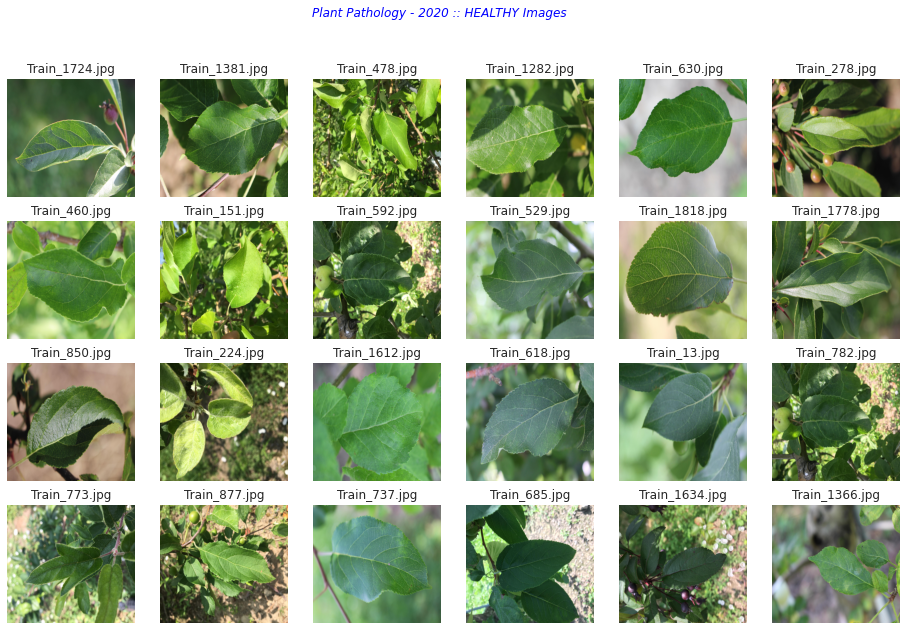

In [ ]:
visualize_images(healthy_sampled_images_tbd, img_class='healthy');


,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0
...,...,...,...,...,...
1816,Train_1816,0,0,0,1
1817,Train_1817,1,0,0,0
1818,Train_1818,1,0,0,0
1819,Train_1819,0,0,1,0


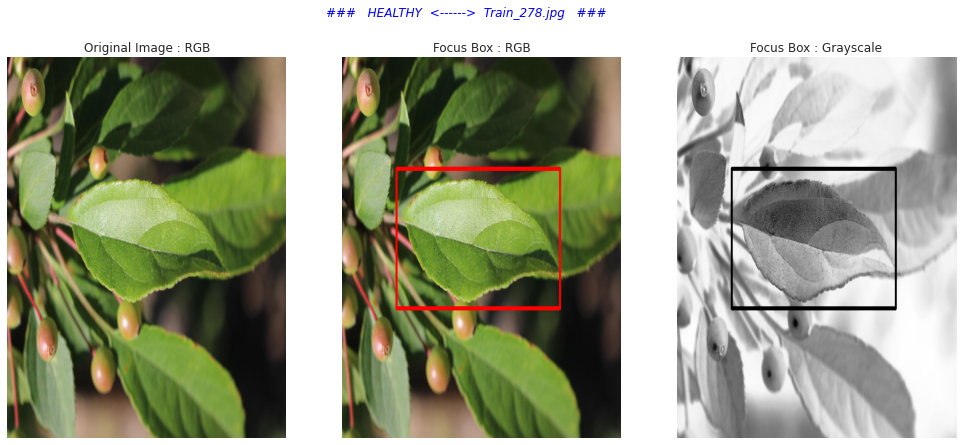

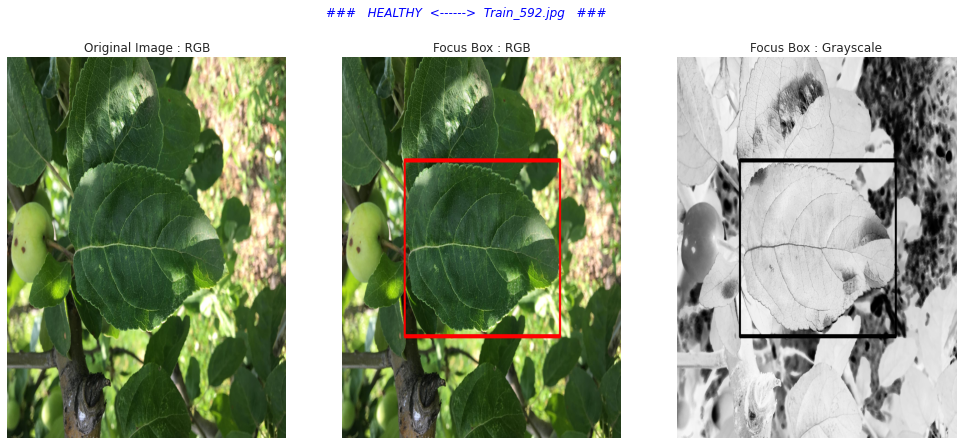

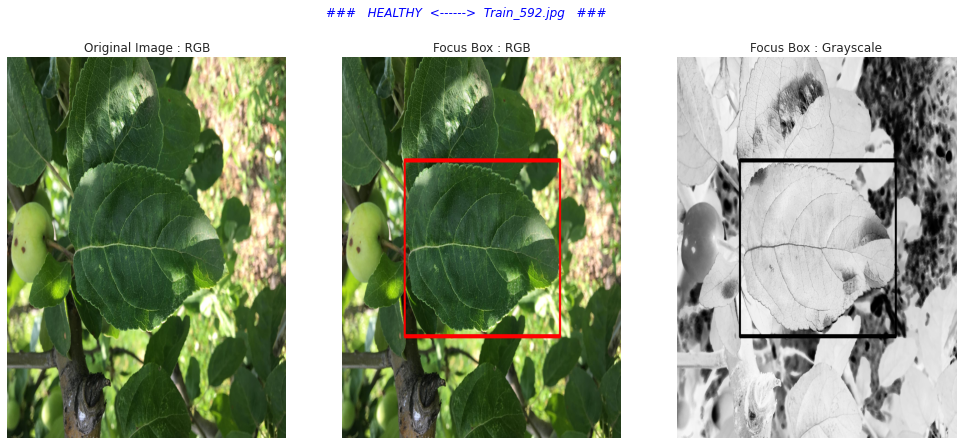

In [ ]:
def plot_big_img(img_name, img_category, start_coord=(450,1500), end_coord=(750,1500), org_axis="on", flag=0):
    """
    Description : This function is created for visualizing some of the IMAGES in bigger size.
    
    Input parameters : It accepts the below 4 inputs:
        - img_name : `str`
            Image name that you want to display.
        - img_category : `str`
            Disease category to which the image belongs.
        - start_coord : `tuple`
            Starting X,Y co-ordinates of the bounding/focus box
        - end_coord : `tuple`
            Ending X,Y co-ordinates of the bounding/focus box
        - org_axis : `str`
            By default it is 'on', but it can also take 'off'. Means whether we want to show the axis lines in the original image.
        - flag : int
            By default it is 0, means GRAYSCALE.
    
    Return : None
    """
    # Reading the image name and its location
    loc = os.path.join(os.path.join(os.path.join("/content/drive/MyDrive/Selected 1 pro/kaggle.json", "input"), "/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7"), "images")
    img_loc = os.path.join(loc,img_name)
      
    # Reading the original image
    ## -1 represents IMREAD_UNCHANGED
    org_img_read = cv2.imread(img_loc, -1)
    org_img_read = cv2.cvtColor(org_img_read, cv2.COLOR_BGR2RGB)
    
    # Reading the original image for adding the potential focus area
    ## -1 represents IMREAD_UNCHANGED
    img_read_tbs = cv2.imread(img_loc, -1)
    img_read_tbs = cv2.cvtColor(img_read_tbs, cv2.COLOR_BGR2RGB)
    bb_img = cv2.rectangle(img_read_tbs, start_coord, end_coord, color=(255,0,0), thickness=13)
    
    # Reading the original image for adding the potential focus area on grayscale image
    ## 0 represents GRAYSCALE
    img_read_gray = cv2.imread(img_loc, flag)
    bb_gray_img = cv2.rectangle(img_read_gray, start_coord, end_coord, color=(255,0,0), thickness=13)
    
    # Plotting the images in the sub-plot
    with plt.style.context('seaborn'):
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(17,7), sharex=False, sharey=False)
        # Plotting the original image
        ax[0].imshow(org_img_read, aspect='auto')
        ax[0].axis(org_axis)
        ax[0].set_title("Original Image : RGB")
        
        # Plotting the segmented image
        ax[1].imshow(bb_img, aspect='auto')
        ax[1].axis("off")
        ax[1].set_title("Focus Box : RGB")
        
        # Plotting the segmented image
        ax[2].imshow(bb_gray_img, aspect='auto')
        ax[2].axis("off")
        ax[2].set_title("Focus Box : Grayscale")
        fig.suptitle("###   {}  <------>  {}   ###\n".format(img_category.upper(), img_name), fontdict=title_font_dict)

plot_big_img("Train_278.jpg", "healthy", start_coord=(400, 400), end_coord=(1600,900), org_axis="off");

plot_big_img("Train_592.jpg", "healthy", start_coord=(460, 1000), end_coord=(1600, 370), org_axis="off");

plot_big_img("Train_592.jpg", "healthy", start_coord=(460, 1000), end_coord=(1600, 370), org_axis="off");

train_images_info_df

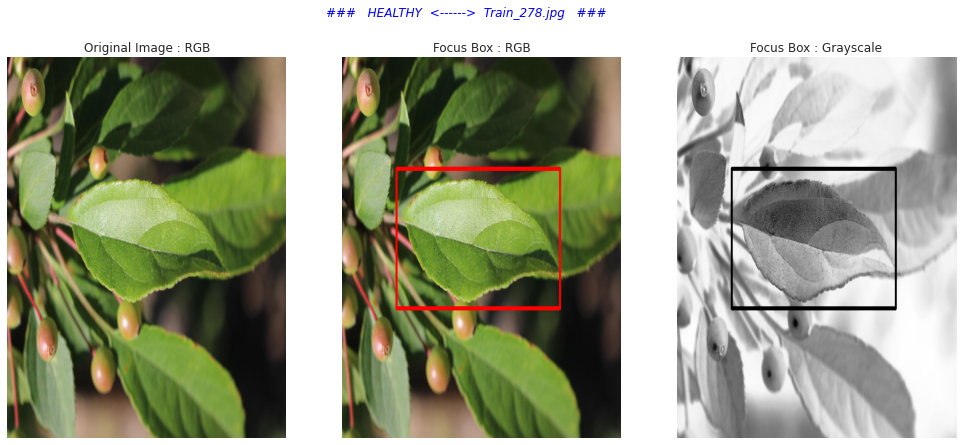

In [ ]:
plot_big_img("Train_278.jpg", "healthy", start_coord=(400, 400), end_coord=(1600,900), org_axis="off");

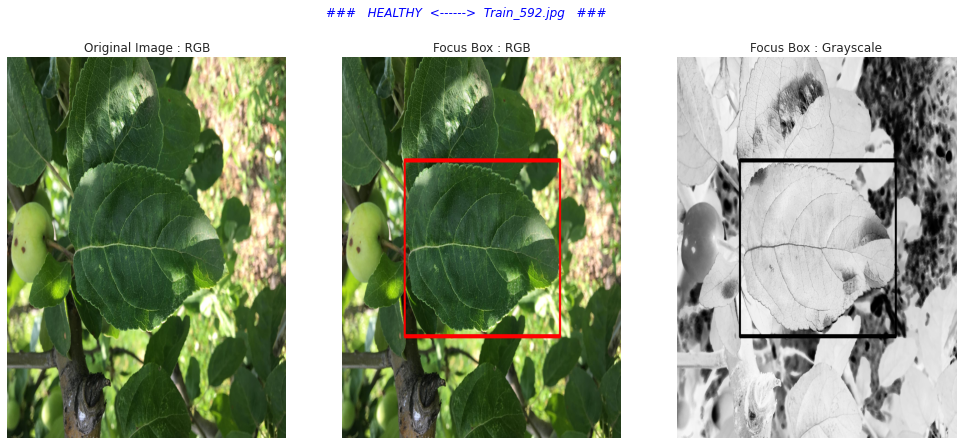

In [ ]:
plot_big_img("Train_592.jpg", "healthy", start_coord=(460, 1000), end_coord=(1600, 370), org_axis="off");

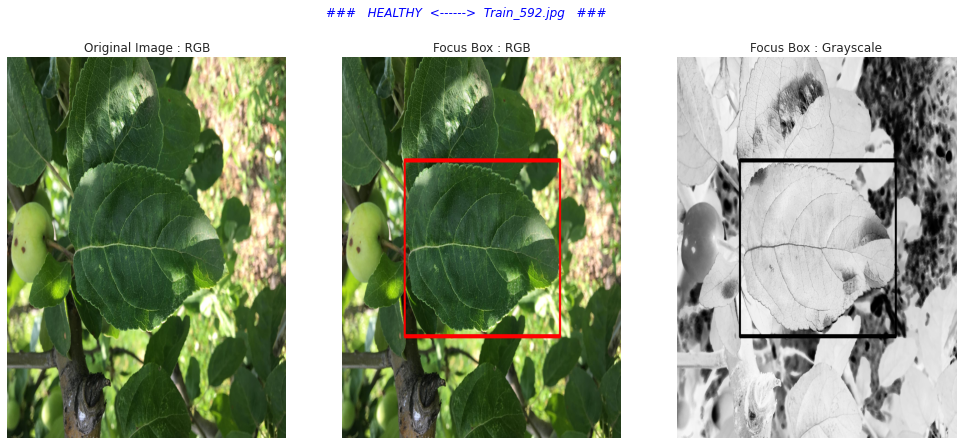

In [ ]:
plot_big_img("Train_592.jpg", "healthy", start_coord=(460, 1000), end_coord=(1600, 370), org_axis="off");

In [ ]:
train_images_info_df

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0
...,...,...,...,...,...
1816,Train_1816,0,0,0,1
1817,Train_1817,1,0,0,0
1818,Train_1818,1,0,0,0
1819,Train_1819,0,0,1,0


In [ ]:

mul_dis_sampled_images = train_images_info_df[train_images_info_df['multiple_diseases'] == 1][['image_id']].sample(n=24, 
                                                                                                                   random_state=91, 
                                                                                                                   replace=False)
mul_dis_sampled_images['image_id'] = mul_dis_sampled_images['image_id'].apply(lambda img_name: img_name+'.jpg')
mul_dis_sampled_images = list(mul_dis_sampled_images['image_id'].values)

mul_dis_sampled_images_tbd = []
for img in mul_dis_sampled_images:
    mul_dis_sampled_images_tbd.append(os.path.join(os.path.join(os.path.join(os.path.join("/content/drive/MyDrive/Selected 1 pro/kaggle.json", "input"), "/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7"), "images"), img))

mul_dis_sampled_images_tbd[0:5]

['/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_1161.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_428.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_1236.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_1035.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_535.jpg']

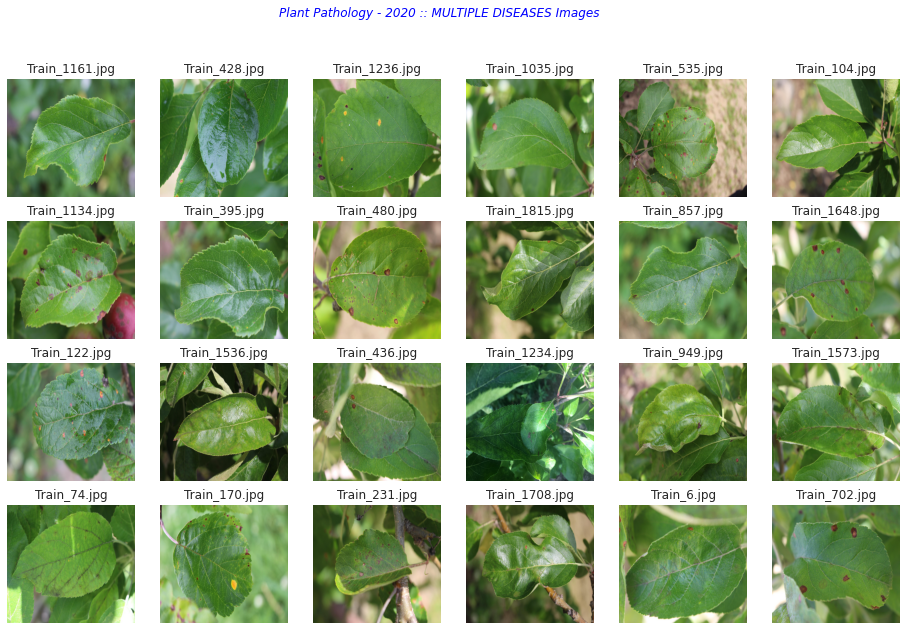

In [ ]:
visualize_images(mul_dis_sampled_images_tbd, img_class='multiple diseases');


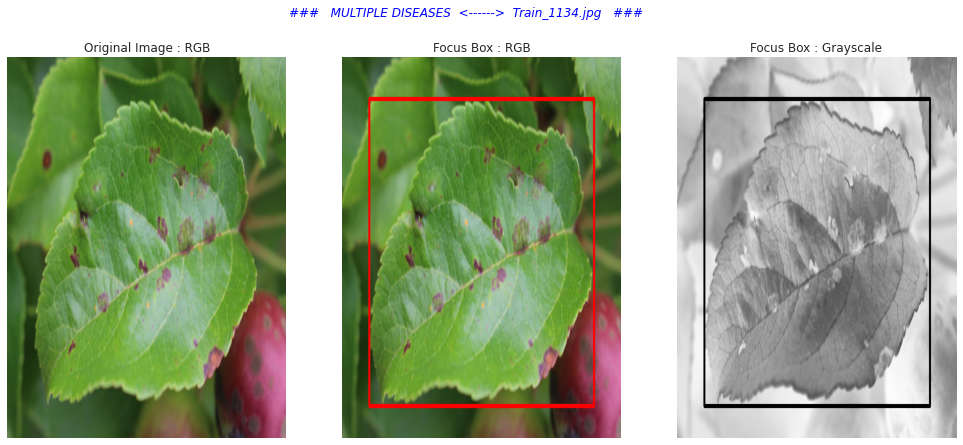

In [ ]:
plot_big_img("Train_1134.jpg", "multiple diseases", start_coord=(200,1250), end_coord=(1850,150), org_axis='off', flag=0);

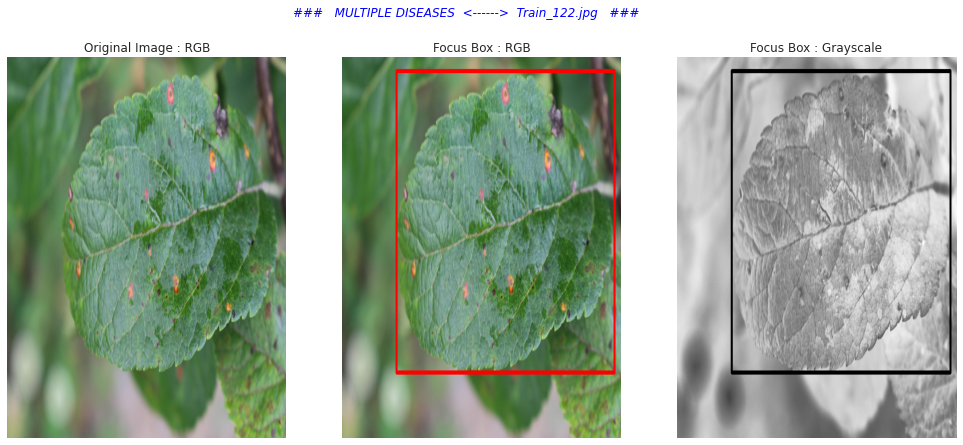

In [ ]:
plot_big_img("Train_122.jpg", "multiple diseases", start_coord=(400,1130), end_coord=(2000,50), org_axis='off');

In [ ]:
train_images_info_df

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0
...,...,...,...,...,...
1816,Train_1816,0,0,0,1
1817,Train_1817,1,0,0,0
1818,Train_1818,1,0,0,0
1819,Train_1819,0,0,1,0


In [ ]:

rust_sampled_images = train_images_info_df[train_images_info_df['rust'] == 1][['image_id']].sample(n=24, random_state=91, replace=False)
rust_sampled_images['image_id'] = rust_sampled_images['image_id'].apply(lambda img_name: img_name+'.jpg')
rust_sampled_images = list(rust_sampled_images['image_id'].values)

rust_sampled_images_tbd = []
for img in rust_sampled_images:
    rust_sampled_images_tbd.append(os.path.join(os.path.join(os.path.join(os.path.join("/content/drive/MyDrive/Selected 1 pro/kaggle.json", "input"), "/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7"), "images"), img))

rust_sampled_images_tbd[0:5]

['/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_1540.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_712.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_683.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_1373.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_39.jpg']

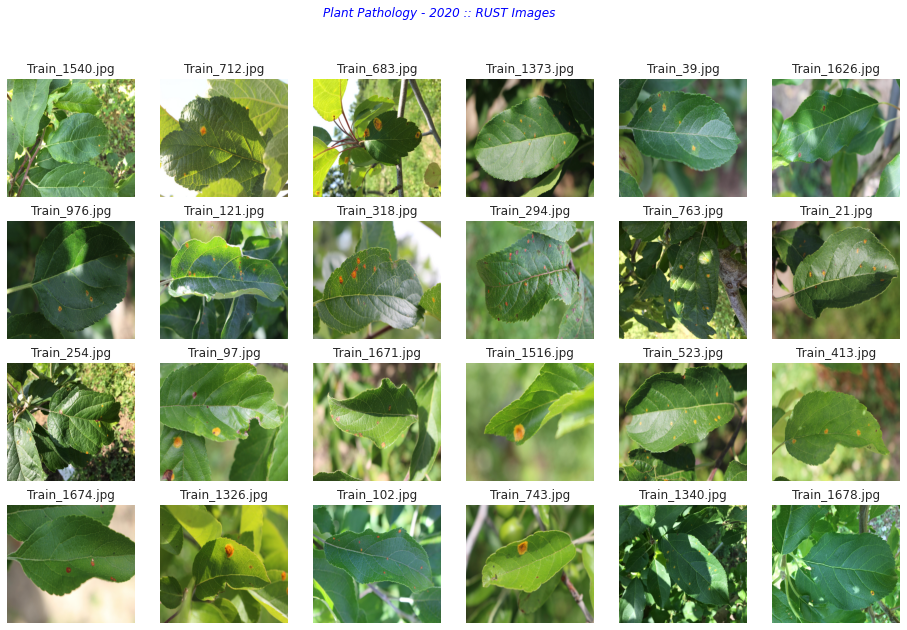

In [ ]:
visualize_images(rust_sampled_images_tbd, img_class='rust');

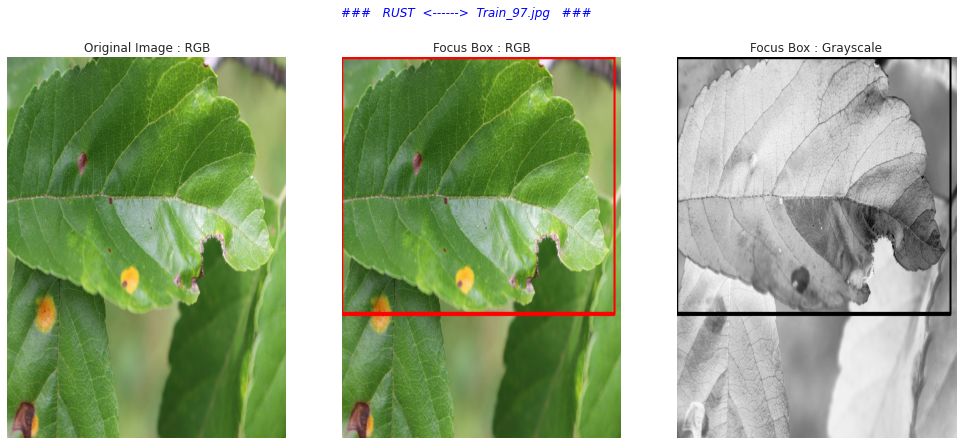

In [ ]:
plot_big_img("Train_97.jpg", "rust", start_coord=(1,920), end_coord=(2000,0), org_axis='off');


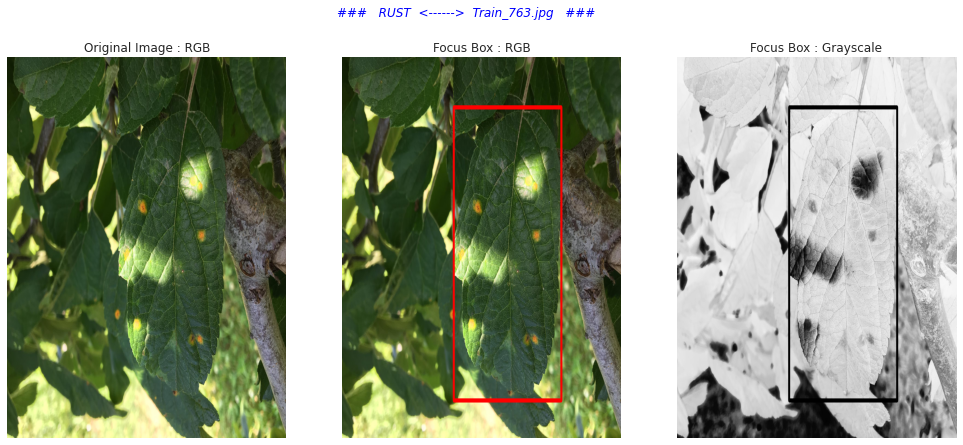

In [ ]:
plot_big_img("Train_763.jpg", "rust", start_coord=(820,1230), end_coord=(1610,180), org_axis='off');

In [ ]:
train_images_info_df


,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0
...,...,...,...,...,...
1816,Train_1816,0,0,0,1
1817,Train_1817,1,0,0,0
1818,Train_1818,1,0,0,0
1819,Train_1819,0,0,1,0


In [ ]:

scab_sampled_images = train_images_info_df[train_images_info_df['scab'] == 1][['image_id']].sample(n=24, random_state=63, replace=False)
scab_sampled_images['image_id'] = scab_sampled_images['image_id'].apply(lambda img_name: img_name+'.jpg')
scab_sampled_images = list(scab_sampled_images['image_id'].values)

scab_sampled_images_tbd = []
for img in scab_sampled_images:
     scab_sampled_images_tbd.append(os.path.join(os.path.join(os.path.join(os.path.join("/content/drive/MyDrive/Selected 1 pro/kaggle.json", "input"), "/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7"), "images"), img))

scab_sampled_images_tbd[0:5]

['/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_112.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_570.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_917.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_230.jpg',
 '/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images/Train_1382.jpg']

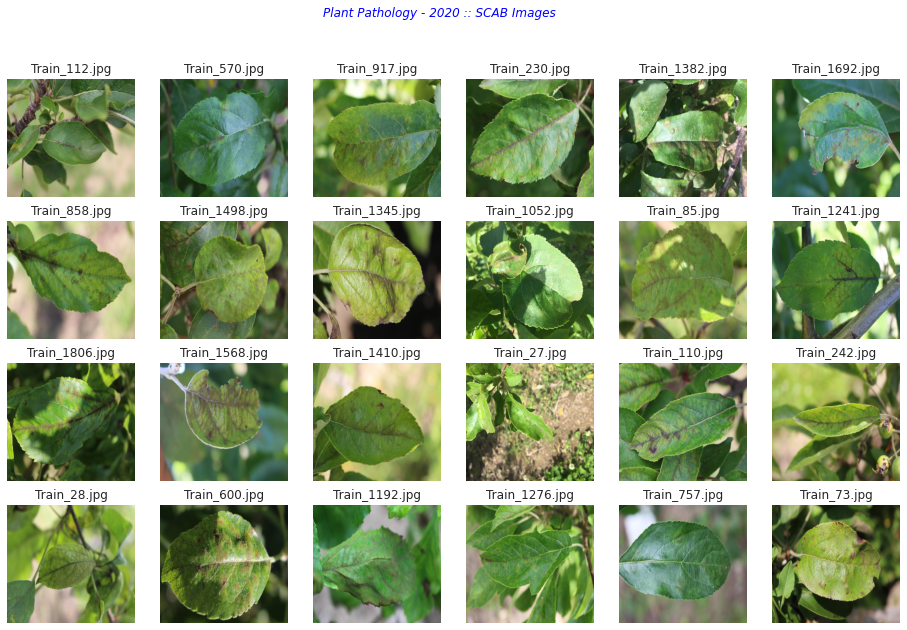

In [ ]:
visualize_images(scab_sampled_images_tbd, img_class='scab');


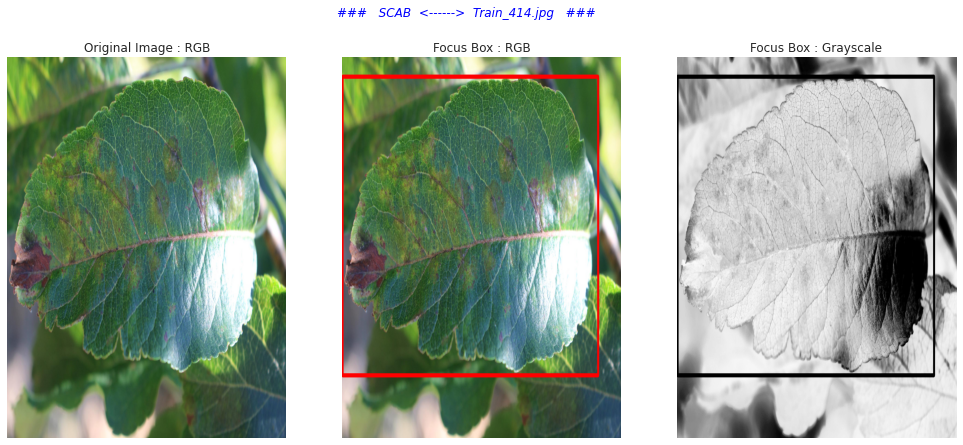

In [ ]:
plot_big_img("Train_414.jpg", "scab", start_coord=(4,1140), end_coord=(1880,70), org_axis='off');

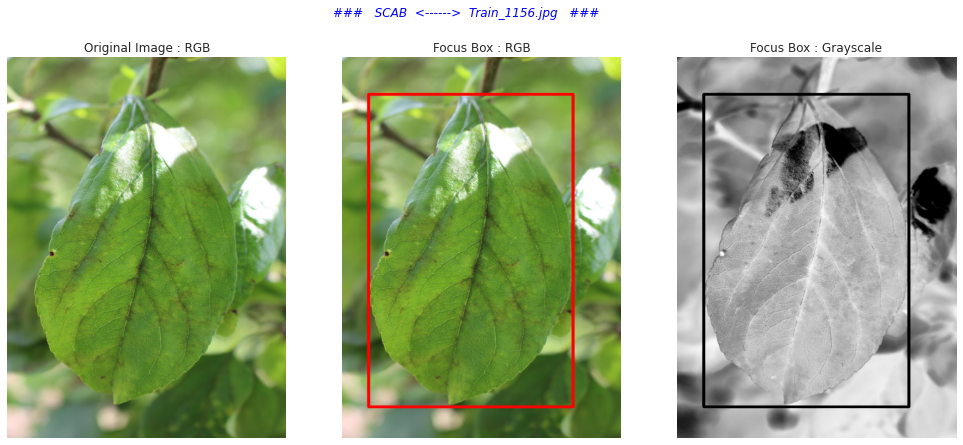

In [ ]:
plot_big_img("Train_1156.jpg", "scab", start_coord=(130,1880), end_coord=(1130,200), org_axis='off');

In [ ]:
all_images_loc = os.path.join(os.path.join(os.path.join("/content/drive/MyDrive/Selected 1 pro/kaggle.json", "input"), "/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7"), "images")
all_images_names = os.listdir(all_images_loc)
all_test_imgs_names = []
all_train_imgs_names = []
for img in all_images_names:
    if img.split("_")[0] == "Test":
        all_test_imgs_names.append(os.path.join(all_images_loc,img))
    else:
        all_train_imgs_names.append(os.path.join(all_images_loc,img))

In [ ]:
# The count of images should be 1821 for TRAIN & TEST sets
len(all_test_imgs_names), len(all_train_imgs_names)

(1821, 1821)

In [ ]:
# Creating TRAIN & TEST images dataframes
all_train_imgs_names_df = pd.DataFrame(all_train_imgs_names, columns=['images_loc'])
all_test_imgs_names_df = pd.DataFrame(all_test_imgs_names, columns=['images_loc'])

In [ ]:
def generate_md5_code(image):
    """
    Description : This function is created for generating the MD5 hexadecimal code of every image.
    
    Input : It accepts one 1 input parameter:
        - image : `str`
            Path of image with its name.
            
    Return : It returns the below object:
        - md5_code : `str`
            Hexadecimal code.
    """
    img = cv2.imread(image)
    md5_generator = hashlib.md5(img)
    md5_code = md5_generator.hexdigest()
    return md5_code

In [ ]:
# All image names with path in a dataframe
all_df = pd.concat([all_train_imgs_names_df, all_test_imgs_names_df], axis=0).reset_index(drop=True)
all_df

,images_loc
0,/content/drive/MyDrive/Selected 1 pro/plant-pa...
1,/content/drive/MyDrive/Selected 1 pro/plant-pa...
2,/content/drive/MyDrive/Selected 1 pro/plant-pa...
3,/content/drive/MyDrive/Selected 1 pro/plant-pa...
4,/content/drive/MyDrive/Selected 1 pro/plant-pa...
...,...
3637,/content/drive/MyDrive/Selected 1 pro/plant-pa...
3638,/content/drive/MyDrive/Selected 1 pro/plant-pa...
3639,/content/drive/MyDrive/Selected 1 pro/plant-pa...
3640,/content/drive/MyDrive/Selected 1 pro/plant-pa...


In [ ]:
# Generating the MD5 hexadecimal codes of all images
all_df['md5_code'] = all_df['images_loc'].apply(lambda img: generate_md5_code(img))

In [ ]:
# Count the occurences of every code
all_md5_counts = pd.DataFrame(all_df['md5_code'].value_counts()).reset_index(drop=False)
all_md5_counts.columns = ['md5_code', 'counts']
all_md5_counts

,md5_code,counts
0,a7882dfb8709f832926b5f52d4fc9072,2
1,81f763a49d628fe3df6425afe7bdde2d,2
2,c09f4dbe73e284fa865473015c1265ef,2
3,a58a14af878cfe29712a9ad1697c4b54,2
4,c2eb0d2a972a549f3950f42a4084635a,2
...,...,...
3632,214d19c51242a29a77b319487a8c1561,1
3633,bbd3e89f51237fa0fc032cda2af5f707,1
3634,3dee343a8a3b4164a2d764197e8af605,1
3635,5a31dc63eb79c3fe6f57bdb78513edcd,1


In [ ]:
# Joining the images names and paths with MD5 Occurences
all_images_md5_counts_df = pd.merge(left=all_df, right=all_md5_counts, on='md5_code')
all_images_md5_counts_df.head(10)

,images_loc,md5_code,counts
0,/content/drive/MyDrive/Selected 1 pro/plant-pa...,fe62cbfd1b0084227c77e9e15ec03d81,1
1,/content/drive/MyDrive/Selected 1 pro/plant-pa...,2094ede3be93b809aabf9ff350211a9c,1
2,/content/drive/MyDrive/Selected 1 pro/plant-pa...,e0b0e127392a19f98b282a4c6beccf2b,1
3,/content/drive/MyDrive/Selected 1 pro/plant-pa...,010ba006ee157ce1623632da89268173,1
4,/content/drive/MyDrive/Selected 1 pro/plant-pa...,dec9419c5ed28e4a4b2ae8d634233fbf,1
5,/content/drive/MyDrive/Selected 1 pro/plant-pa...,de69699ace0b315ba60307ae094df7e8,1
6,/content/drive/MyDrive/Selected 1 pro/plant-pa...,3fbc4d970aff9938066291f8863e9130,1
7,/content/drive/MyDrive/Selected 1 pro/plant-pa...,3281d575af338c7368c267c3c85073d0,1
8,/content/drive/MyDrive/Selected 1 pro/plant-pa...,6a7d039a7516536910132a9cd3f9b0ce,1
9,/content/drive/MyDrive/Selected 1 pro/plant-pa...,0596e7c4f994994798b9023dd54e211e,1


In [ ]:
# Duplicate images in the TRAIN & TEST images
duplicates_df = all_images_md5_counts_df[all_images_md5_counts_df['counts'] == 2].copy(deep=True)
duplicates_df['images_loc'] = duplicates_df['images_loc'].apply(lambda path: path.split("/")[-1])
duplicates_df.reset_index(drop=True, inplace=True)
duplicates_df

,images_loc,md5_code,counts
0,Train_1505.jpg,a58a14af878cfe29712a9ad1697c4b54,2
1,Test_829.jpg,a58a14af878cfe29712a9ad1697c4b54,2
2,Train_1703.jpg,c09f4dbe73e284fa865473015c1265ef,2
3,Test_1407.jpg,c09f4dbe73e284fa865473015c1265ef,2
4,Train_379.jpg,81f763a49d628fe3df6425afe7bdde2d,2
5,Train_1173.jpg,81f763a49d628fe3df6425afe7bdde2d,2
6,Test_1691.jpg,c2eb0d2a972a549f3950f42a4084635a,2
7,Test_683.jpg,c2eb0d2a972a549f3950f42a4084635a,2
8,Test_570.jpg,a7882dfb8709f832926b5f52d4fc9072,2
9,Test_1212.jpg,a7882dfb8709f832926b5f52d4fc9072,2


In [ ]:
# Let's display the duplicate images
duplicate_images = duplicates_df['images_loc'].values
duplicate_images

array(['Train_1505.jpg', 'Test_829.jpg', 'Train_1703.jpg',
       'Test_1407.jpg', 'Train_379.jpg', 'Train_1173.jpg',
       'Test_1691.jpg', 'Test_683.jpg', 'Test_570.jpg', 'Test_1212.jpg'],
      dtype=object)

In [ ]:
all_images_loc

'/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images'

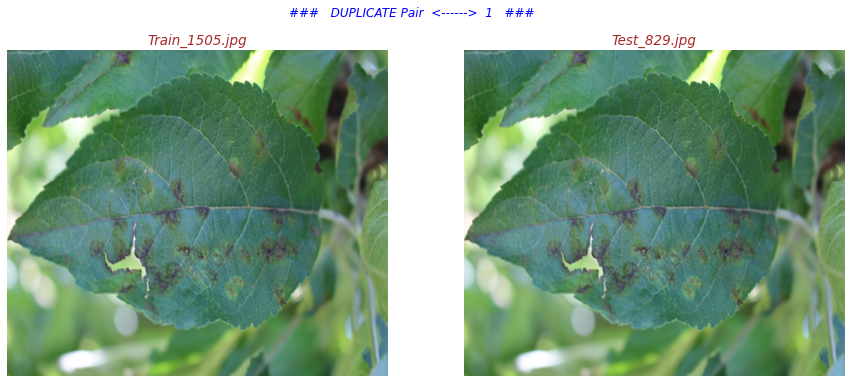

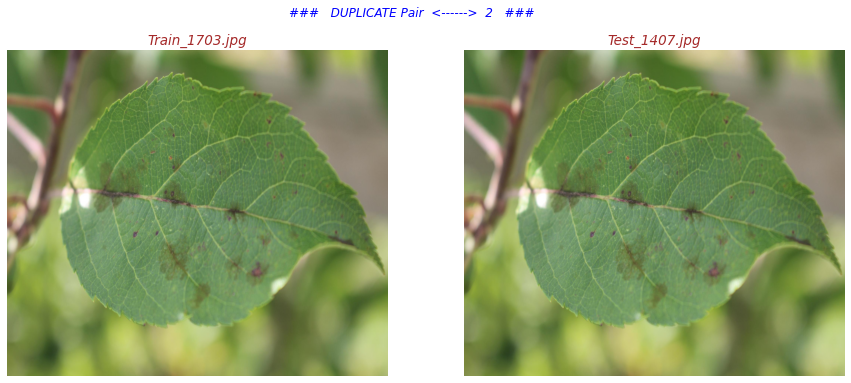

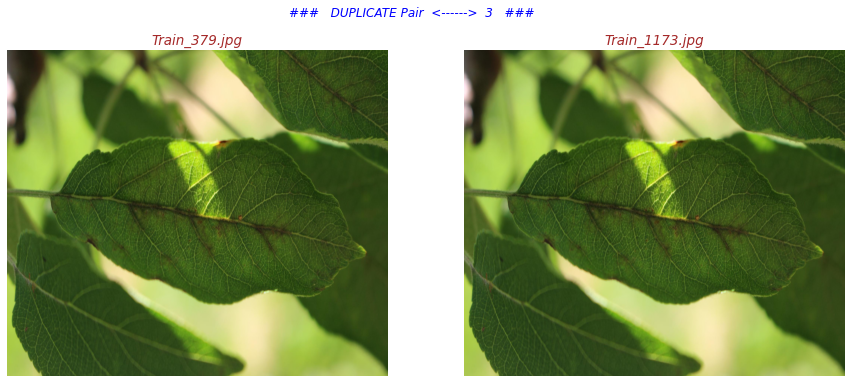

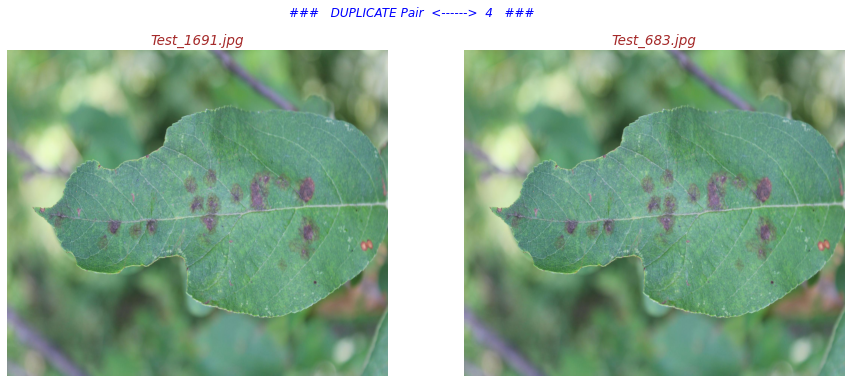

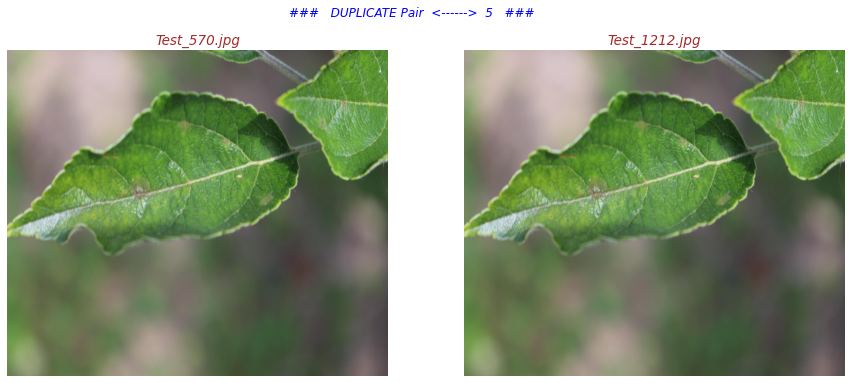

In [ ]:
col1_images = duplicate_images[::2]
col2_images = duplicate_images[1::2]

for i in range(len(col1_images)):
    with plt.style.context('seaborn-poster'):
            fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6), sharex=False, sharey=False)
            # Storing the images with specific path or location
            img1_path = os.path.join(all_images_loc, col1_images[i])
            img2_path = os.path.join(all_images_loc, col2_images[i])

            # Reading the images
            img1 = cv2.imread(img1_path)
            img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
            
            img2 = cv2.imread(img2_path)
            img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
            
            # Plotting the image-1
            ax[0].imshow(img1, aspect='auto')
            ax[0].axis("off")
            ax[0].set_title(col1_images[i], fontdict=label_font_dict)

            # Plotting the image-2
            ax[1].imshow(img2, aspect='auto')
            ax[1].axis("off")
            ax[1].set_title(col2_images[i], fontdict=label_font_dict)

            # Figure title
            fig.suptitle("###   DUPLICATE Pair  <------>  {}   ###\n".format(i+1), fontdict=title_font_dict)

In [ ]:
all_images_md5_counts_df['img_name'] = all_images_md5_counts_df['images_loc'].apply(lambda img_path: img_path.split("/")[-1])
all_images_md5_counts_df.head(10)

,images_loc,md5_code,counts,img_name
0,/content/drive/MyDrive/Selected 1 pro/plant-pa...,fe62cbfd1b0084227c77e9e15ec03d81,1,Train_762.jpg
1,/content/drive/MyDrive/Selected 1 pro/plant-pa...,2094ede3be93b809aabf9ff350211a9c,1,Train_763.jpg
2,/content/drive/MyDrive/Selected 1 pro/plant-pa...,e0b0e127392a19f98b282a4c6beccf2b,1,Train_761.jpg
3,/content/drive/MyDrive/Selected 1 pro/plant-pa...,010ba006ee157ce1623632da89268173,1,Train_839.jpg
4,/content/drive/MyDrive/Selected 1 pro/plant-pa...,dec9419c5ed28e4a4b2ae8d634233fbf,1,Train_822.jpg
5,/content/drive/MyDrive/Selected 1 pro/plant-pa...,de69699ace0b315ba60307ae094df7e8,1,Train_816.jpg
6,/content/drive/MyDrive/Selected 1 pro/plant-pa...,3fbc4d970aff9938066291f8863e9130,1,Train_785.jpg
7,/content/drive/MyDrive/Selected 1 pro/plant-pa...,3281d575af338c7368c267c3c85073d0,1,Train_807.jpg
8,/content/drive/MyDrive/Selected 1 pro/plant-pa...,6a7d039a7516536910132a9cd3f9b0ce,1,Train_82.jpg
9,/content/drive/MyDrive/Selected 1 pro/plant-pa...,0596e7c4f994994798b9023dd54e211e,1,Train_809.jpg


In [ ]:
all_images_md5_counts_df[(all_images_md5_counts_df['img_name'] == "Train_592.jpg") | (all_images_md5_counts_df['img_name'] == "Train_782.jpg")]

,images_loc,md5_code,counts,img_name
67,/content/drive/MyDrive/Selected 1 pro/plant-pa...,3caa65fc0a8cd4ccf2aeabea021bd5fb,1,Train_782.jpg
997,/content/drive/MyDrive/Selected 1 pro/plant-pa...,208674a886f9f971a851b90e825c1ac0,1,Train_592.jpg


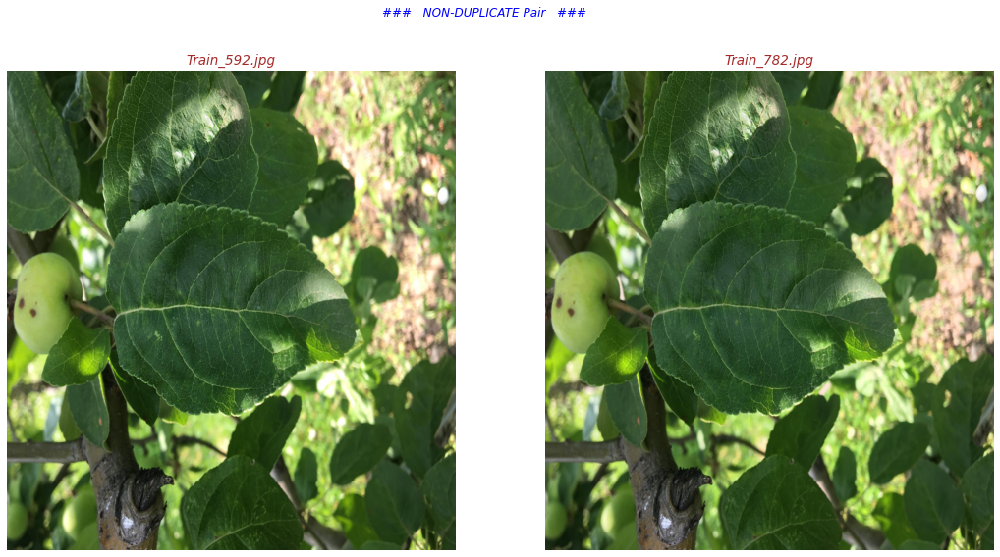

In [ ]:
with plt.style.context('seaborn-poster'):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18,9), sharex=False, sharey=False)
    # Storing the images with specific path or location
    img1_path = os.path.join(all_images_loc, "Train_592.jpg")
    img2_path = os.path.join(all_images_loc, "Train_782.jpg")
    
    # Reading the images
    img1 = cv2.imread(img1_path)
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
         
    img2 = cv2.imread(img2_path)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
            
    # Plotting the image-1
    ax[0].imshow(img1, aspect='auto')
    ax[0].axis("off")
    ax[0].set_title("Train_592.jpg", fontdict=label_font_dict)

    # Plotting the image-2
    ax[1].imshow(img2, aspect='auto')
    ax[1].axis("off")
    ax[1].set_title("Train_782.jpg", fontdict=label_font_dict)

    # Figure title
    fig.suptitle("###   NON-DUPLICATE Pair   ###", fontdict=title_font_dict)

In [ ]:
print(len(all_images_names)), print(all_images_loc)


3642
/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7/images


(None, None)

In [ ]:
all_images_data = pd.DataFrame(all_images_names)
all_images_data.columns = ['Image_Name']
all_images_data['Image_Loc'] = all_images_loc
all_images_data

,Image_Name,Image_Loc
0,Test_1674.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
1,Test_1672.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
2,Test_1678.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
3,Test_1679.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
4,Test_1671.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
...,...,...
3637,Train_1536.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
3638,Train_1529.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
3639,Train_1508.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
3640,Train_1541.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...


In [ ]:
def read_images(image_path):
    """
    Description : This function is created for reading the images.
    """
    # Reading the image
    img = cv2.imread(image_path, -1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Retrieving the mean value of all the channels of an image
    red_channel = np.median(img[:,:,0])
    green_channel = np.median(img[:,:,1])
    blue_channel = np.median(img[:,:,2])
    return [red_channel, green_channel, blue_channel]

In [ ]:
all_images_data.head()

,Image_Name,Image_Loc
0,Test_1674.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
1,Test_1672.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
2,Test_1678.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
3,Test_1679.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...
4,Test_1671.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...


In [ ]:
all_images_data["Mean_Channel_Values"] = all_images_data[['Image_Loc', 'Image_Name']].progress_apply(lambda row: read_images(os.path.join(row['Image_Loc'], row['Image_Name'])), axis=1)

100%|██████████| 3642/3642 [04:10<00:00, 14.56it/s]


In [ ]:
all_images_data

,Image_Name,Image_Loc,Mean_Channel_Values
0,Test_1674.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...,"[115.0, 142.0, 73.0]"
1,Test_1672.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...,"[87.0, 159.0, 114.0]"
2,Test_1678.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...,"[93.0, 123.0, 63.0]"
3,Test_1679.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...,"[94.0, 147.0, 72.0]"
4,Test_1671.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...,"[72.0, 106.0, 65.0]"
...,...,...,...
3637,Train_1536.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...,"[74.0, 103.0, 36.0]"
3638,Train_1529.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...,"[118.0, 136.0, 115.0]"
3639,Train_1508.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...,"[99.0, 137.0, 94.0]"
3640,Train_1541.jpg,/content/drive/MyDrive/Selected 1 pro/plant-pa...,"[44.0, 80.0, 61.0]"


In [ ]:
rgb_vals = all_images_data['Mean_Channel_Values'].apply(pd.Series)
rgb_vals.columns = ['Red', 'Green', 'Blue']
rgb_vals

,Red,Green,Blue
0,115.0,142.0,73.0
1,87.0,159.0,114.0
2,93.0,123.0,63.0
3,94.0,147.0,72.0
4,72.0,106.0,65.0
...,...,...,...
3637,74.0,103.0,36.0
3638,118.0,136.0,115.0
3639,99.0,137.0,94.0
3640,44.0,80.0,61.0


In [ ]:
all_images_data_channels = pd.concat([all_images_data, rgb_vals], axis=1)
all_images_data_channels.drop(['Mean_Channel_Values'], axis=1, inplace=True)
all_images_data_channels.rename(columns={'Image_Name': 'image_id'}, inplace=True)
all_images_data_channels['image_id'] = all_images_data_channels['image_id'].apply(lambda val: val.split(".")[0])
all_images_data_channels

,image_id,Image_Loc,Red,Green,Blue
0,Test_1674,/content/drive/MyDrive/Selected 1 pro/plant-pa...,115.0,142.0,73.0
1,Test_1672,/content/drive/MyDrive/Selected 1 pro/plant-pa...,87.0,159.0,114.0
2,Test_1678,/content/drive/MyDrive/Selected 1 pro/plant-pa...,93.0,123.0,63.0
3,Test_1679,/content/drive/MyDrive/Selected 1 pro/plant-pa...,94.0,147.0,72.0
4,Test_1671,/content/drive/MyDrive/Selected 1 pro/plant-pa...,72.0,106.0,65.0
...,...,...,...,...,...
3637,Train_1536,/content/drive/MyDrive/Selected 1 pro/plant-pa...,74.0,103.0,36.0
3638,Train_1529,/content/drive/MyDrive/Selected 1 pro/plant-pa...,118.0,136.0,115.0
3639,Train_1508,/content/drive/MyDrive/Selected 1 pro/plant-pa...,99.0,137.0,94.0
3640,Train_1541,/content/drive/MyDrive/Selected 1 pro/plant-pa...,44.0,80.0,61.0


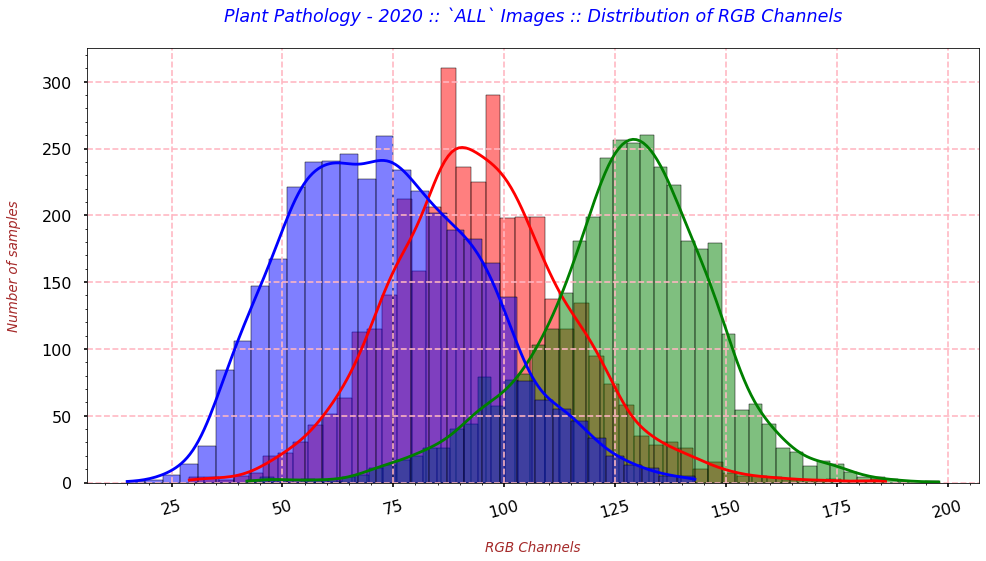

In [ ]:
# Visualizing distribution of RGB channels of ALL Images
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(all_images_data_channels['Red'], kde=True, color='red', legend=True)
    sns.histplot(all_images_data_channels['Green'], kde=True, color='green', legend=True)
    sns.histplot(all_images_data_channels['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRGB Channels", fontdict=label_font_dict)
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology - 2020 :: `ALL` Images :: Distribution of RGB Channels\n", fontdict=title_font_dict)

###  ALL Images  ::  RED channel  ###  
  MIN --> 29.0  
  MAX --> 186.0  
  MEAN --> 94.51565074135091  
  MEDIAN --> 93.5
  RANGE --> 157.0



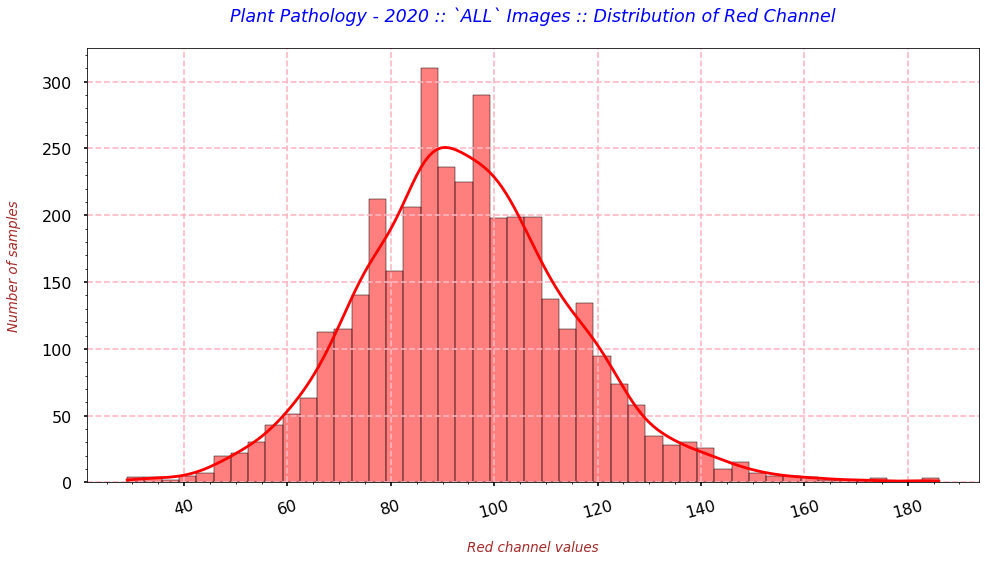

In [ ]:
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "RED", 
                                            all_images_data_channels['Red'].min(), 
                                            all_images_data_channels['Red'].max(),
                                            all_images_data_channels['Red'].mean(),
                                            all_images_data_channels['Red'].median(),
                                            (all_images_data_channels['Red'].max() - all_images_data_channels['Red'].min())))

# Visualizing only RED channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(all_images_data_channels['Red'], kde=True, color='red', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRed channel values", fontdict=label_font_dict)
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology - 2020 :: `ALL` Images :: Distribution of Red Channel\n", fontdict=title_font_dict)

###  ALL Images  ::  GREEN channel  ###  
  MIN --> 42.0  
  MAX --> 198.0  
  MEAN --> 126.91103789126853  
  MEDIAN --> 128.0
  RANGE --> 156.0



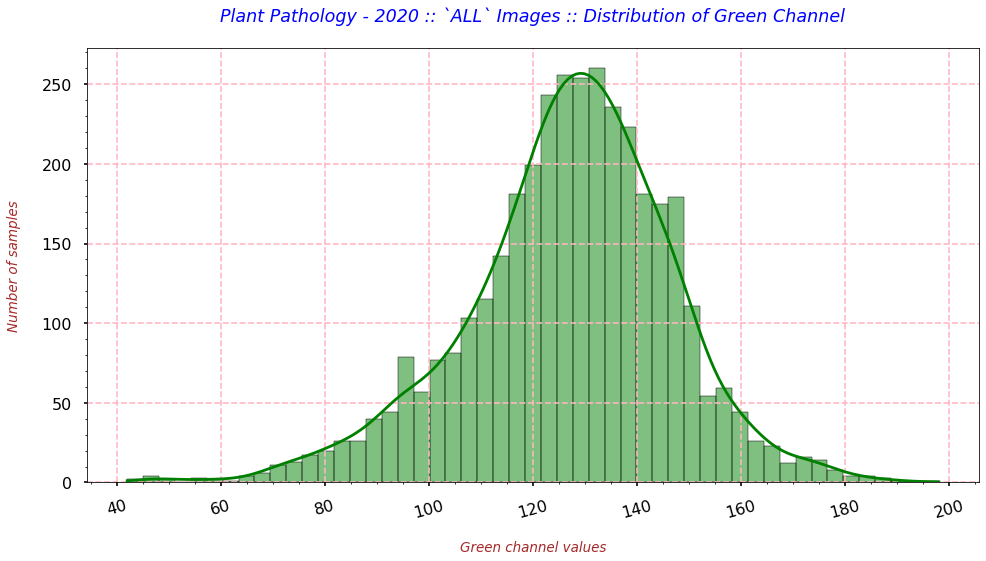

In [ ]:
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "GREEN", 
                                            all_images_data_channels['Green'].min(), 
                                            all_images_data_channels['Green'].max(),
                                            all_images_data_channels['Green'].mean(),
                                            all_images_data_channels['Green'].median(),
                                            (all_images_data_channels['Green'].max() - all_images_data_channels['Green'].min())))

# Visualizing only GREEN channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(all_images_data_channels['Green'], kde=True, color='green', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nGreen channel values", fontdict=label_font_dict)
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology - 2020 :: `ALL` Images :: Distribution of Green Channel\n", fontdict=title_font_dict)

###  ALL Images  ::  BLUE channel  ###  
  MIN --> 15.0  
  MAX --> 143.0  
  MEAN --> 73.1891817682592  
  MEDIAN --> 72.0
  RANGE --> 128.0



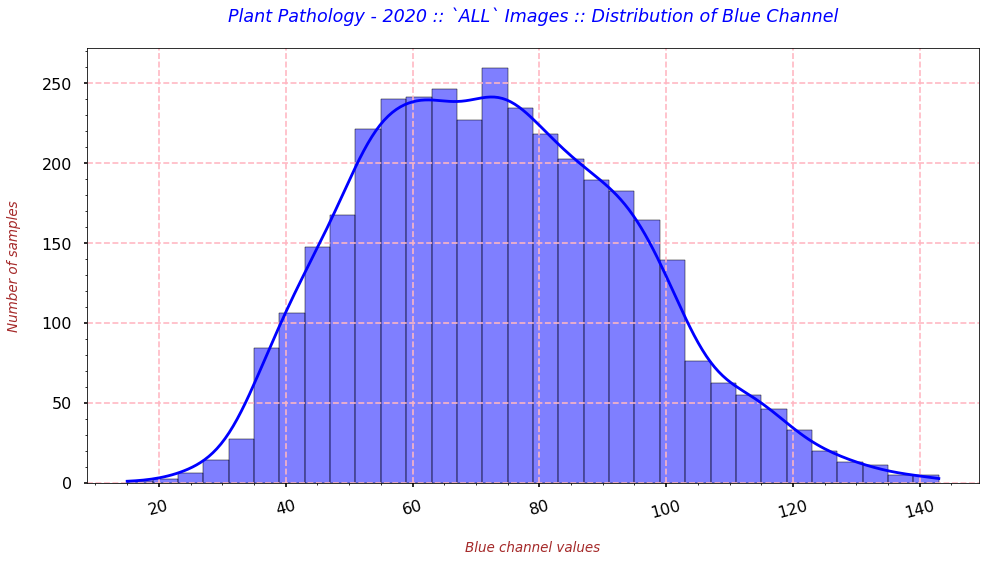

In [ ]:
# MIN, MAX, MEAN & MEDIAN of a channel
print("###  {}  ::  {} channel  ###  \n  MIN --> {}  \n  MAX --> {}  \n  MEAN --> {}  \
\n  MEDIAN --> {}\n  RANGE --> {}\n".format("ALL Images",
                                            "BLUE", 
                                            all_images_data_channels['Blue'].min(), 
                                            all_images_data_channels['Blue'].max(),
                                            all_images_data_channels['Blue'].mean(),
                                            all_images_data_channels['Blue'].median(),
                                            (all_images_data_channels['Blue'].max() - all_images_data_channels['Blue'].min())))

# Visualizing only BLUE channel
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(all_images_data_channels['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nBlue channel values", fontdict=label_font_dict)
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology - 2020 :: `ALL` Images :: Distribution of Blue Channel\n", fontdict=title_font_dict)

In [ ]:
# Use this dataframe for joining
train_images_info_df

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0
...,...,...,...,...,...
1816,Train_1816,0,0,0,1
1817,Train_1817,1,0,0,0
1818,Train_1818,1,0,0,0
1819,Train_1819,0,0,1,0


In [ ]:
train_img_chnl_data_tgts = pd.merge(left=all_images_data_channels, right=train_images_info_df, on='image_id')
train_img_chnl_data_tgts

,image_id,Image_Loc,Red,Green,Blue,healthy,multiple_diseases,rust,scab
0,Train_762,/content/drive/MyDrive/Selected 1 pro/plant-pa...,89.0,121.0,61.0,0,1,0,0
1,Train_763,/content/drive/MyDrive/Selected 1 pro/plant-pa...,56.0,77.0,42.0,0,0,1,0
2,Train_761,/content/drive/MyDrive/Selected 1 pro/plant-pa...,72.0,95.0,57.0,1,0,0,0
3,Train_839,/content/drive/MyDrive/Selected 1 pro/plant-pa...,111.0,137.0,63.0,1,0,0,0
4,Train_822,/content/drive/MyDrive/Selected 1 pro/plant-pa...,91.0,113.0,47.0,0,0,1,0
...,...,...,...,...,...,...,...,...,...
1816,Train_1536,/content/drive/MyDrive/Selected 1 pro/plant-pa...,74.0,103.0,36.0,0,1,0,0
1817,Train_1529,/content/drive/MyDrive/Selected 1 pro/plant-pa...,118.0,136.0,115.0,0,0,0,1
1818,Train_1508,/content/drive/MyDrive/Selected 1 pro/plant-pa...,99.0,137.0,94.0,1,0,0,0
1819,Train_1541,/content/drive/MyDrive/Selected 1 pro/plant-pa...,44.0,80.0,61.0,1,0,0,0


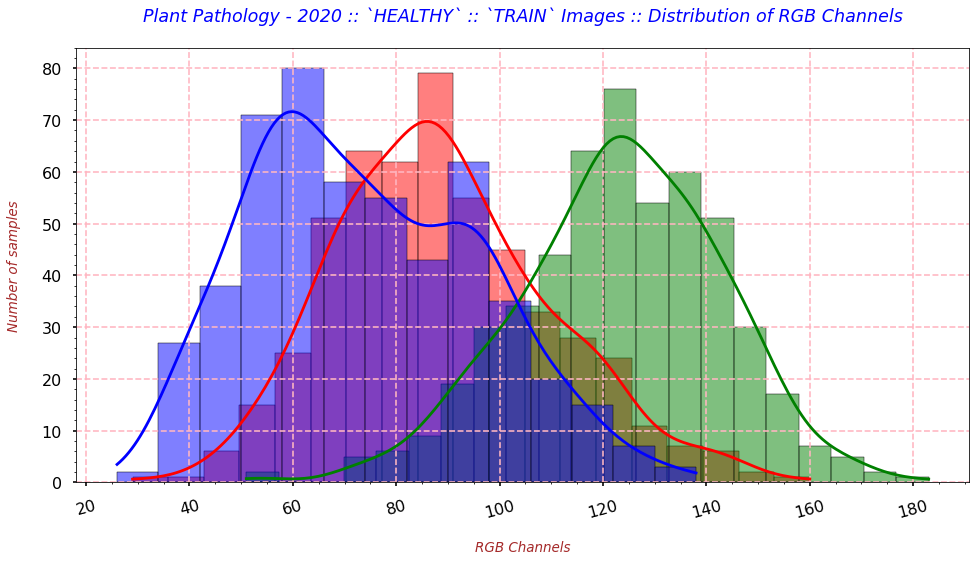

In [ ]:
# Visualizing distribution of RGB channels of HEALTHY :: TRAIN Images
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(16,8))
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Red'], kde=True, color='red', legend=True)
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Green'], kde=True, color='green', legend=True)
    sns.histplot(train_img_chnl_data_tgts[train_img_chnl_data_tgts['healthy'] == 1]['Blue'], kde=True, color='blue', legend=True)
    # Providing the labels and title to the graph
    plt.xlabel("\nRGB Channels", fontdict=label_font_dict)
    plt.xticks(rotation=15)
    plt.ylabel("Number of samples\n", fontdict=label_font_dict)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightpink')
    plt.title("Plant Pathology - 2020 :: `HEALTHY` :: `TRAIN` Images :: Distribution of RGB Channels\n", fontdict=title_font_dict)

In [35]:
img_size=100
dataset_folder = os.path.join("/content/drive/MyDrive/Selected 1 pro/plant-pathology-2020-fgvc7")

In [36]:
datasetObject = pd.read_csv(os.path.join(dataset_folder, "train.csv"))
datasetObject.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [34]:
import pathlib
from keras.metrics import Precision, Recall
import tensorflow as tf

In [37]:
imagesDataset = pathlib.Path(os.path.join(dataset_folder, "images"))
listImages = list(imagesDataset.glob("*.*"))

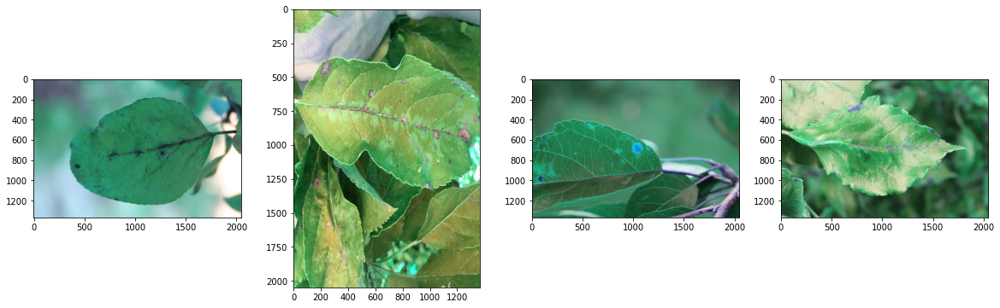

In [38]:
plt.figure(figsize = (20, 6))
for i in range(4):
    plt.subplot(1, 4, i + 1)
    img = cv2.imread(str(listImages[i]))
    plt.imshow(img)
plt.show()

In [39]:
images_id_csv = datasetObject['image_id']
healthy_csv = datasetObject['healthy']
multiple_diseases_csv = datasetObject['multiple_diseases']
rust_csv = datasetObject['rust']
scab_csv = datasetObject['scab']

In [40]:
images = []
labels = []
for index, values in enumerate(images_id_csv):
    img = cv2.imread(os.path.join(dataset_folder, "images", "{}.jpg".format(values)))
    img = cv2.resize(img, (img_size, img_size))
    img = img/255.0
    labels.append([healthy_csv[index], multiple_diseases_csv[index], rust_csv[index],
                 scab_csv[index]])
    images.append(img)

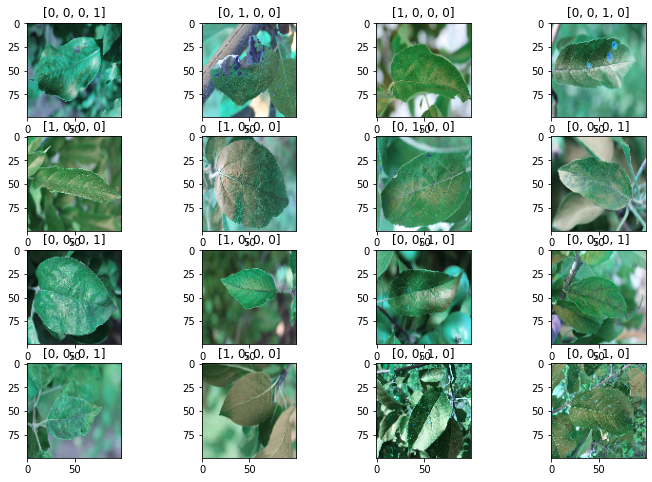

In [41]:
plt.figure(figsize = (12, 8))
for i in range(16):
  plt.subplot(4, 4, i + 1)
  plt.imshow(images[i])
  plt.title(labels[i])
plt.show()

In [42]:
img_data_g = tf.keras.preprocessing.image.ImageDataGenerator(
        rotation_range=0.35,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        shear_range=0.2,
        width_shift_range=0.15,
        height_shift_range=0.15,
        rescale=None)

In [43]:
images_after_aug = []
labels_after_aug = []
for index, image in enumerate(images):
  for i in range(1):
      img = img_data_g.flow(np.reshape(image, (1, img_size, img_size, 3))).next()
      images_after_aug.append(np.reshape(img, (img_size, img_size, 3)))
      labels_after_aug.append(labels[index])
labels = np.asarray(labels_after_aug)
images = np.asarray(images_after_aug)

In [44]:
images.shape

(1821, 100, 100, 3)

/usr/local/lib/python3.8/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


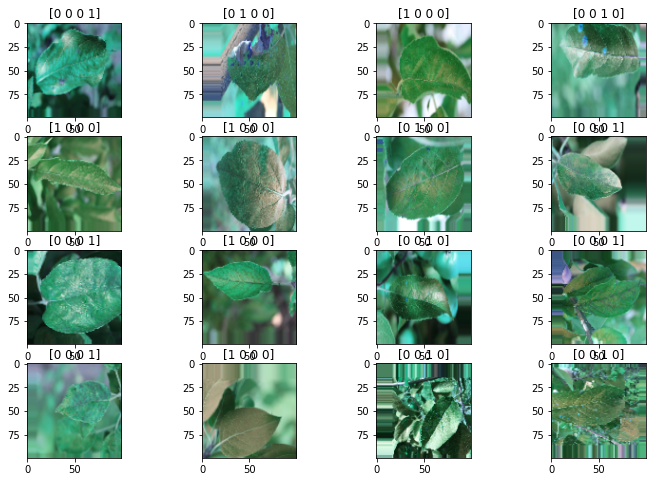

In [45]:
plt.figure(figsize = (12, 8))
for i in range(16):
  plt.subplot(4, 4, i + 1)
  plt.imshow(images[i])
  plt.title(labels[i])
plt.show()

In [46]:
d = tf.keras.applications.DenseNet121(include_top=False,
                   input_shape=(img_size,img_size,3),
                   pooling=None,
                   weights='imagenet')
for i in d.layers:
  i.trainable = True

In [47]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size = 0.15, random_state = 42)
# x_train = x_train.T
# x_test = x_test.T
# y_train = y_train.T
# y_test = y_test.T

print("x train: ",x_train.shape)
print("x test: ",x_test.shape)
print("y train: ",y_train.shape)
print("y test: ",y_test.shape)

x train:  (1547, 100, 100, 3)
x test:  (274, 100, 100, 3)
y train:  (1547, 4)
y test:  (274, 4)


In [49]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers, models



   
model = models.Sequential([
   
    layers.Rescaling(1./255,input_shape=(100,100,3)),
    layers.Flatten(),
   
    # layers.Dense(128, activation='relu'),
    # layers.Dense(64, activation='relu'),
    layers.Dense(100, activation='relu'),
    layers.Dense(4, activation='softmax')
])

 
LR_reduce=ReduceLROnPlateau(monitor='val_accuracy',
                            factor=0.5,
                            patience=10, # Change from 6
                            min_lr=0.000001, # Change from 0.00001
                            verbose=1)

# Compiling the model
# model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy'])


# Start to train model
hist=model.fit_generator(img_data_g.flow(x_train,y_train,batch_size=32), # Change from 32
                    epochs=100,
                    steps_per_epoch=x_train.shape[0]//32,# Change from 200
                    verbose=1,
                    validation_data=(x_test,y_test),
                    
                    )
                    
                  

Epoch 1/100


<ipython-input-49-9f94b74a5f0f>:33: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  hist=model.fit_generator(img_data_g.flow(x_train,y_train,batch_size=32), # Change from 32


48/48 [==============================] - 6s 110ms/step - loss: 1.2627 - accuracy: 0.3373 - val_loss: 1.2332 - val_accuracy: 0.3394
Epoch 2/100
48/48 [==============================] - 5s 106ms/step - loss: 1.2399 - accuracy: 0.3431 - val_loss: 1.2282 - val_accuracy: 0.3504
Epoch 3/100
48/48 [==============================] - 5s 107ms/step - loss: 1.2430 - accuracy: 0.3300 - val_loss: 1.2233 - val_accuracy: 0.3504
Epoch 4/100
48/48 [==============================] - 5s 104ms/step - loss: 1.2352 - accuracy: 0.3426 - val_loss: 1.2186 - val_accuracy: 0.3467
Epoch 5/100
48/48 [==============================] - 5s 103ms/step - loss: 1.2371 - accuracy: 0.3670 - val_loss: 1.2453 - val_accuracy: 0.3285
Epoch 6/100
48/48 [==============================] - 5s 106ms/step - loss: 1.2351 - accuracy: 0.3677 - val_loss: 1.2206 - val_accuracy: 0.3577
Epoch 7/100
48/48 [==============================] - 5s 107ms/step - loss: 1.2274 - accuracy: 0.3789 - val_loss: 1.2175 - val_accuracy: 0.3686
Epoch 8/100

In [51]:
from sklearn.metrics import confusion_matrix
y_pred=model.predict(x_test) 
y_pred=np.argmax(y_pred, axis=1)
y_test=np.argmax(y_test, axis=1)
cm = confusion_matrix(y_test, y_pred)

print('Confusion Matrix\n')
print(cm)

#importing accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(y_test, y_pred)))

print('Micro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='micro')))
print('Micro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='micro')))
print('Micro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='micro')))

print('Macro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='macro')))
print('Macro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='macro')))
print('Macro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='macro')))

print('Weighted Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='weighted')))
print('Weighted Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='weighted')))
print('Weighted F1-score: {:.2f}'.format(f1_score(y_test, y_pred, average='weighted')))

from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(y_test, y_pred, target_names=['Class 1', 'Class 2', 'Class 3','Class 4']))

9/9 [==============================] - 0s 10ms/step
Confusion Matrix

[[32  0 19 27]
 [ 0  0  7  6]
 [16  0 38 36]
 [20  0 24 49]]

Accuracy: 0.43

Micro Precision: 0.43
Micro Recall: 0.43
Micro F1-score: 0.43

Macro Precision: 0.33
Macro Recall: 0.34
Macro F1-score: 0.33

Weighted Precision: 0.42
Weighted Recall: 0.43
Weighted F1-score: 0.42

Classification Report

              precision    recall  f1-score   support

     Class 1       0.47      0.41      0.44        78
     Class 2       0.00      0.00      0.00        13
     Class 3       0.43      0.42      0.43        90
     Class 4       0.42      0.53      0.46        93

    accuracy                           0.43       274
   macro avg       0.33      0.34      0.33       274
weighted avg       0.42      0.43      0.42       274



/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetr

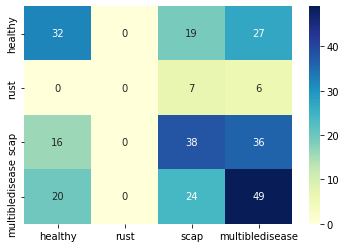

In [52]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm_matrix = pd.DataFrame(data=cm, columns=['healthy', 'rust','scap','multibledisease'],
                         index=['healthy', 'rust','scap','multibledisease'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

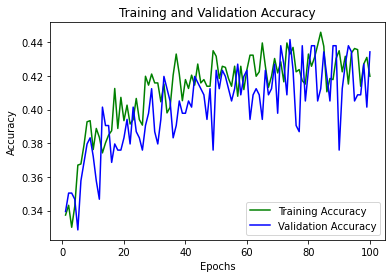

In [55]:
train_acc=hist.history['accuracy']
test_acc=hist.history['val_accuracy']
epochs=range(1,101)
plt.plot(epochs,train_acc,'g',label='Training Accuracy')
plt.plot(epochs,test_acc,'b',label='Validation Accuracy')
plt.title("Training and Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

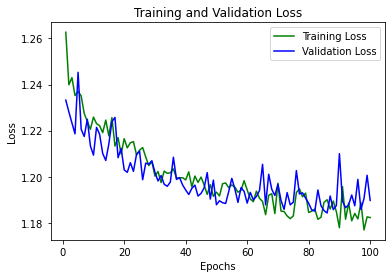

In [56]:
loss_train=hist.history['loss']
loss_val=hist.history['val_loss']
epochs=range(1,101)
plt.plot(epochs,loss_train,'g',label='Training Loss')
plt.plot(epochs,loss_val,'b',label='Validation Loss')
plt.title("Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_ranking.py:999: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


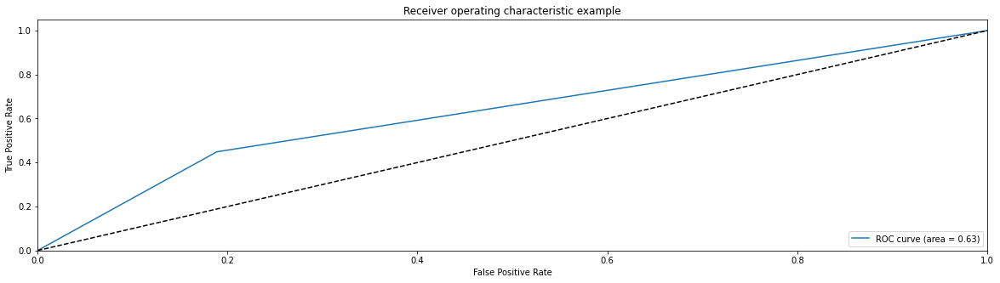

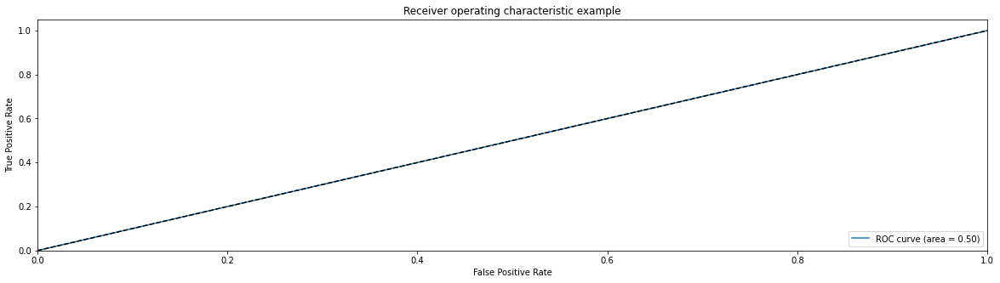

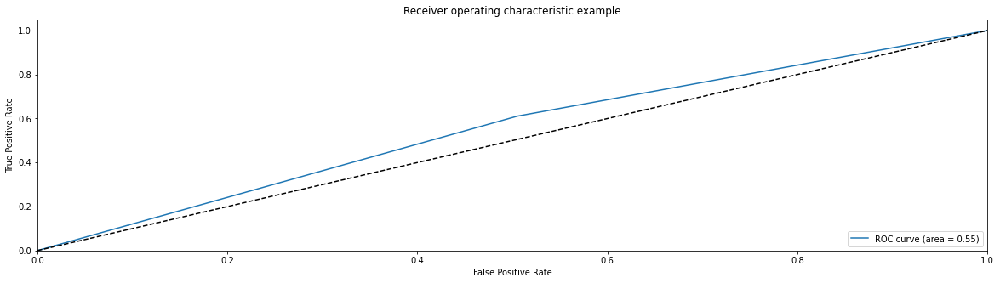

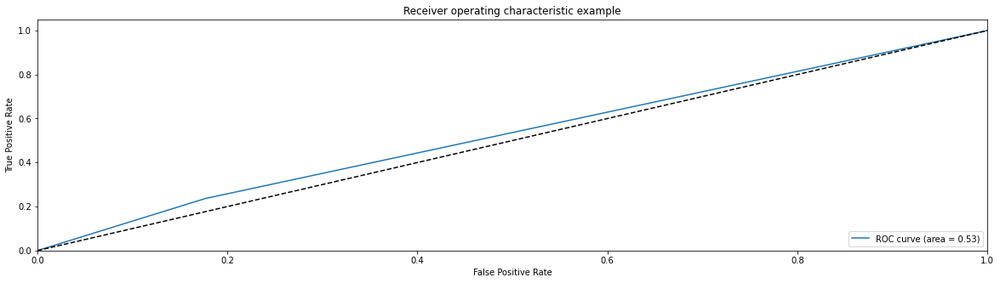

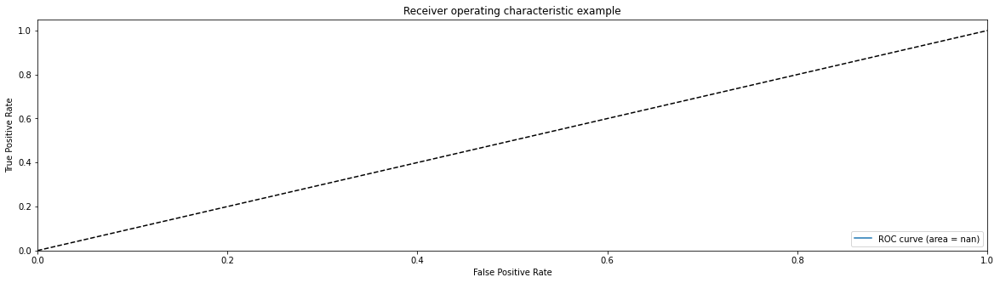

In [63]:
from sklearn.preprocessing import label_binarize
n_classes=4;
test_y2 = label_binarize(y_test, classes=[0,1,2,3,4])
pred2 = label_binarize(y_preds, classes=[0,1,2,3,4])
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(5):
    fpr[i], tpr[i], _ = roc_curve(test_y2[:, i], pred2[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
# Plot of a ROC curve for a specific class
for i in range(5):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()